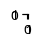

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150
sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.data_processing import BL62_VALUES, BL62FREQ_VALUES, HLAS, AA_KEYS
from src.utils import pkl_load, pkl_dump, get_palette
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE
from src.metrics import reconstruction_accuracy, VAELoss, TripletLoss, CombinedVAELoss, compute_cosine_distance
from src.datasets import TCRSpecificDataset, FullTCRDataset
import torch
from torch import optim
from torch.utils.data import RandomSampler, SequentialSampler
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180

In [2]:
# Load models together
from src.torch_utils import load_model_full
from src.metrics import compute_cosine_distance
from src.utils import get_class_initcode_keys
from src.models import BimodalVAEClassifier, FullTCRVAE, PeptideClassifier
from src.datasets import BimodalTCRpMHCDataset, FullTCRDataset, LatentTCRpMHCDataset, TCRSpecificDataset
from src.train_eval import predict_model
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
pos_df = pd.read_csv('../data/filtered/230927_nettcr_positives_only.csv')
mix_df = pd.read_csv('../data/filtered/231205_nettcr_old_26pep_with_swaps.csv')


def get_model(folder):
    pt = glob.glob(folder+'/*.pt')[0]
    js = glob.glob(folder+'/*.json')[0]
    model = load_model_full(pt, js, return_json=False, verbose=False)
    return model
    

In [12]:
from src.datasets import BimodalTCRpMHCDataset
dataset_pep = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, 12, add_positional_encoding=True, encoding='BL50LO', pad_scale=-20)
dataset_tcr = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, 0, add_positional_encoding=False, encoding='BL50LO', pad_scale=-20)
loader_pep = dataset_pep.get_dataloader(2048, SequentialSampler)
loader_tcr = dataset_tcr.get_dataloader(2048, SequentialSampler)

# do heatmap for retrained model

In [25]:
from src.datasets import BimodalTCRpMHCDataset
dataset_pep = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, 12, add_positional_encoding=True, encoding='BL50LO', pad_scale=-20)
dataset_tcr = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, 0, add_positional_encoding=False, encoding='BL50LO', pad_scale=-20)
loader_pep = dataset_pep.get_dataloader(1024, SequentialSampler)
loader_tcr = dataset_tcr.get_dataloader(1024, SequentialSampler)

# Doing a single model, validation fold, using cosine distance matrix

In [26]:
from src.sim_utils import make_dist_matrix, compute_cosine_distance
vae_ct = get_model('../output/240129_pepswapped/240122_PepSwapped_NormalFull_CosTrp_PosEncode_AddPep_LowMarg_fold_1_KFold_1_240126_1445_XXXXX/')
vae_nt = get_model('../output/240129_pepswapped/240122_PepSwapped_NormalFull_NoTrp_PosEncode_AddPep_LowMarg_fold_1_KFold_1_240126_1445_XXXXX/')
vae_tight = get_model('../output/240119_PosEnc_AddPep/240115_twostageFullTCR_WarmUpLowerMargin2Kepochs_KFold_1_240115_1401_TIGHT/').vae

preds_ct = predict_model(vae_ct, dataset_pep, loader_pep)
preds_nt = predict_model(vae_nt, dataset_pep, loader_pep)
preds_tight = predict_model(vae_tight, dataset_tcr, loader_tcr)

valid_ct = make_dist_matrix(preds_ct.query('partition==1'))
valid_nt = make_dist_matrix(preds_nt.query('partition==1'))
valid_tight = make_dist_matrix(preds_tight.query('partition==1'))

In [432]:
preds_tight['true_reconstructed'].iloc[[0]].item()

'KALYSXXLLKGGEQXGTEIGGGTSYGKLTXXXXXXXXMNHEYXSMNVEVXASGTETQYXXXXXXXXXXXXXXX'

# retry some classic clustering methods on new computed distance matrices

In [3]:
from sklearn.cluster import KMeans, HDBSCAN, AgglomerativeClustering
from sklearn.metrics import calinski_harabasz_score as ch_score
from sklearn.metrics import davies_bouldin_score as db_score


In [167]:

features = preds_ct.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values

# High CH and low DB = good cluster
print(ch_score(features, pred), db_score(features, pred))
random = np.random.randint(0,150,len(pred))
print(ch_score(features, random), db_score(features, random))


47.82596448232042 3.0879978497489518
0.980234178413273 6.360854926708255


<Axes: >

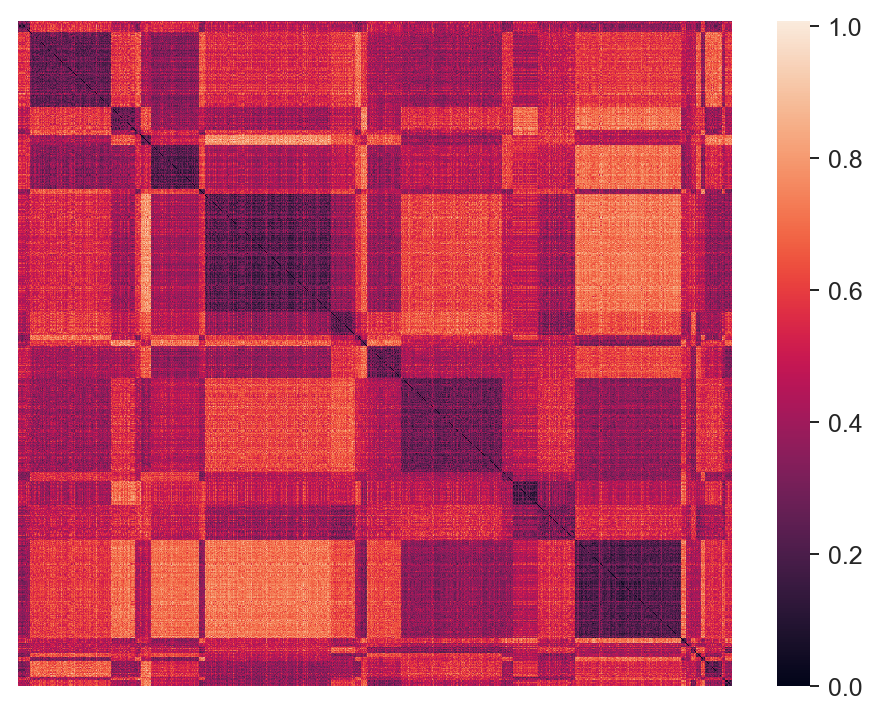

In [96]:
st= valid_ct.sort_values('peptide').drop(columns=['peptide','original_peptide'])
sns.heatmap(st[st.index], xticklabels=False, yticklabels=False)

<Axes: >

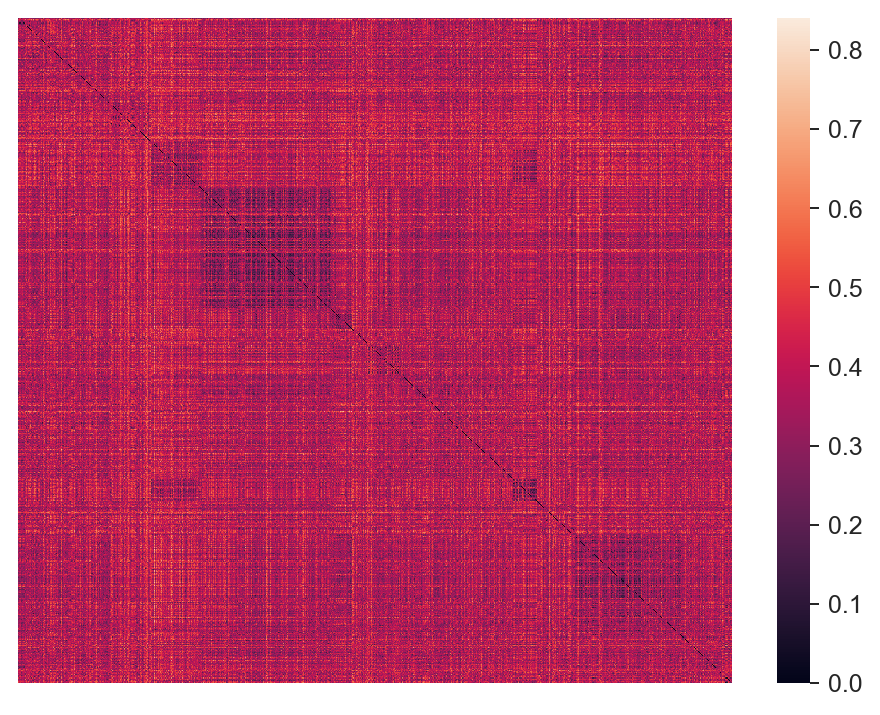

In [169]:
tight= valid_tight.sort_values('peptide').drop(columns=['peptide','original_peptide'])
sns.heatmap(tight[tight.index], xticklabels=False, yticklabels=False)

In [ ]:
hdb = HDBSCAN(min_cluster_size=2, metric='precomputed', cluster_selection_epsilon=0.13)
sample = valid_ct.copy()
pred = hdb.fit_predict(sample.drop(columns=['peptide','original_peptide']).values)
print(len(np.unique(pred)))
sample['pred_label'] = pred
gb = sample.groupby(['pred_label', 'peptide']).agg(count=('original_peptide','count'))
gb.query('pred_label!=-1')

In [192]:

features = preds_ct.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values

sample = valid_ct.copy()
results = []
for cl_size in [2,3,4,5,6,7,8]:
    for t in tqdm(np.linspace(0.08, 0.16, 100)):
        hdb = HDBSCAN(min_cluster_size=cl_size, metric='precomputed', cluster_selection_epsilon=t)
        pred = hdb.fit_predict(sample.drop(columns=['peptide','original_peptide']).values)
        results.append([cl_size, t, round(ch_score(features, pred),5), round(db_score(features, pred),5), 'HDBSCAN'])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 27.84it/s]


# Agglo clustering

## init


In [4]:
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
def get_linkage_matrix(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    return linkage_matrix

def get_aggcluster_heatmap_plot(preds, linkage='average', distance_threshold=0.457675, title='', fn='file'):
    sample = preds.query('partition==1')[['A1', 'A2', 'A3', 'B1', 'B2', 'B3']+[z for z in preds.columns if z.startswith('z_')]+['peptide', 'original_peptide']].sort_values('original_peptide')
    sample_dist_matrix = make_dist_matrix(sample)
    # Do agglomerative clustering with hyperparameters found earlier
    agg = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage=linkage, distance_threshold=distance_threshold)
    predicted_clusters = agg.fit_predict(sample_dist_matrix.drop(columns=['peptide','original_peptide']).values)
    linkage_matrix = get_linkage_matrix(agg)
    
    # Get a PCA of the features
    features = sample[[z for z in preds.columns if z.startswith('z_')]+['peptide', 'original_peptide']]
    pca = PCA(n_components=15)
    pca_feats = pd.DataFrame(pca.fit_transform(features.drop(columns=['peptide', 'original_peptide']).values), columns = [f'PCA_{i}' for i in range(pca.n_components_)])
    # Create the colour scheme
    labels = features.pop('original_peptide')
    row_colors = {k:v for k,v in zip(labels.unique(), sns.color_palette('Paired', 26))}
    mapped_colors = labels.map(row_colors).reset_index(drop=True)
    
    g = sns.clustermap(pca_feats, col_cluster=False, row_linkage=linkage_matrix, col_linkage=None, row_colors=mapped_colors, cbar_pos=(.975, .35, .035, .45),
                   label=True, cmap = 'viridis', z_score=0, dendrogram_ratio=(0.2, 0))
    fig = g.fig
    ax = g.ax_heatmap
    ax.set_yticklabels([])
    ax.set_yticks([])
    fig.suptitle(title, y=1.05)
    g.savefig(f'{fn}.png', dpi=180)


## hp tune

In [ ]:
features = preds_ct.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values
sample = valid_ct.copy()

for linkage in ['average', 'single', 'complete']:
    for t in tqdm(np.linspace(0.06, 0.5, 500)):
        clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
        predicted_hc = clustering.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)
        try:
            ch = round(ch_score(features, predicted_hc),5)
        except ValueError:
            continue
        try:
            db = round(db_score(features, predicted_hc),5)
        except ValueError:
            continue
        
        results.append([linkage, t, ch, db, 'hierarchical'])

In [416]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
# This is using the cosine-trained+pepswap VAE model
results = pd.DataFrame(results, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
mms = MinMaxScaler()
results['CH_scaled'] = mms.fit_transform(results['CH_score'].values.reshape((-1,1)))
results['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results['DB_score'].values.reshape((-1,1)))
results['hmean'] = results.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
results['mean'] = results.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
display(results.sort_values('hmean', ascending=False).head(1))
display(results.sort_values('mean', ascending=False).head(1))

,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
1897,average,0.461202,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
1893,average,0.457675,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
features = preds_nt.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values
sample = valid_nt.copy()

results_nt = []
for linkage in ['average', 'single', 'complete']:
    for t in tqdm(np.linspace(0.06, 0.5, 500)):
        clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
        predicted_hc = clustering.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)
        try:
            ch = round(ch_score(features, predicted_hc),5)
        except ValueError:
            continue
        try:
            db = round(db_score(features, predicted_hc),5)
        except ValueError:
            continue
        
        results_nt.append([linkage, t, ch, db, 'hierarchical'])

In [380]:
results.CH_score.max(), results.DB_score.min()

(108.49863, 0.32239)

In [415]:
results_nt = pd.DataFrame(results_nt, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
mms = MinMaxScaler()
results_nt['CH_scaled'] = mms.fit_transform(results_nt['CH_score'].values.reshape((-1,1)))
results_nt['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results_nt['DB_score'].values.reshape((-1,1)))
results_nt['hmean'] = results_nt.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
results_nt['mean'] = results_nt.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
display(results_nt.sort_values('hmean', ascending=False).head(1))
display(results_nt.sort_values('mean', ascending=False).head(1))
results_nt.CH_score.max(), results_nt.DB_score.min()

,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
884,complete,0.06,22.345,0.18084,hierarchical,1.0,1.0,1.0,1.0


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
888,complete,0.063527,22.345,0.18084,hierarchical,1.0,1.0,1.0,1.0


(22.345, 0.18084)

In [414]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
features = preds_tight.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values
sample = valid_tight.copy()

results_tight = []
for linkage in ['average', 'single', 'complete']:
    for t in tqdm(np.linspace(0.06, 0.5, 500)):
        clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
        predicted_hc = clustering.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)
        try:
            ch = round(ch_score(features, predicted_hc),5)
        except ValueError:
            continue
        try:
            db = round(db_score(features, predicted_hc),5)
        except ValueError:
            continue
        
        results_tight.append([linkage, t, ch, db, 'hierarchical'])


results_tight = pd.DataFrame(results_tight, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
mms = MinMaxScaler()
results_tight['CH_scaled'] = mms.fit_transform(results_tight['CH_score'].values.reshape((-1,1)))
results_tight['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results_tight['DB_score'].values.reshape((-1,1)))
results_tight['hmean'] = results_tight.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
results_tight['mean'] = results_tight.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
display(results_tight.sort_values('hmean', ascending=False).head(1))
display(results_tight.sort_values('mean', ascending=False).head(1))
results_tight.CH_score.max(), results_tight.DB_score.min()

100%|██████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.01it/s]


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
453,average,0.459439,32.34826,2.15759,hierarchical,1.0,0.328133,0.494127,0.664067


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
441,average,0.448858,32.34826,2.15759,hierarchical,1.0,0.328133,0.494127,0.664067


(32.34826, 0.28325)

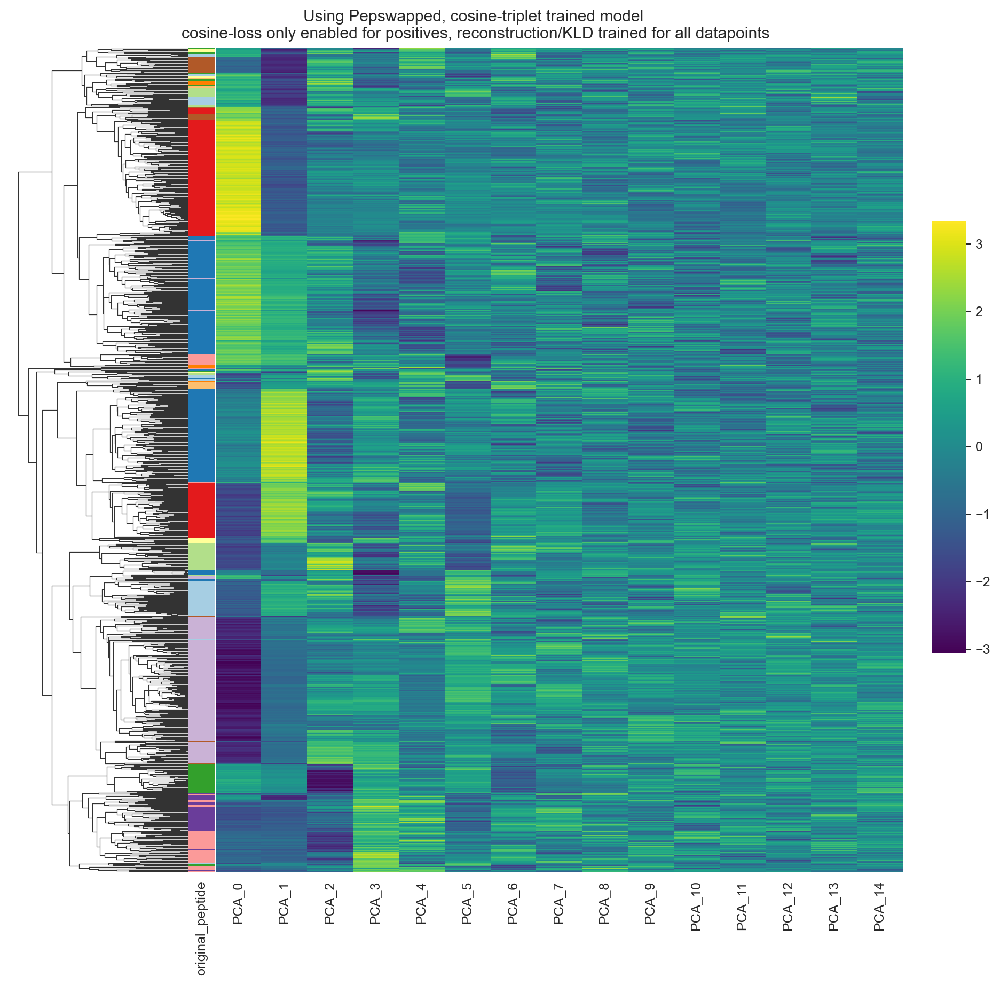

In [423]:

get_aggcluster_heatmap_plot(preds_ct, linkage='average', distance_threshold=0.461202, title='Using Pepswapped, cosine-triplet trained model \ncosine-loss only enabled for positives, reconstruction/KLD trained for all datapoints')

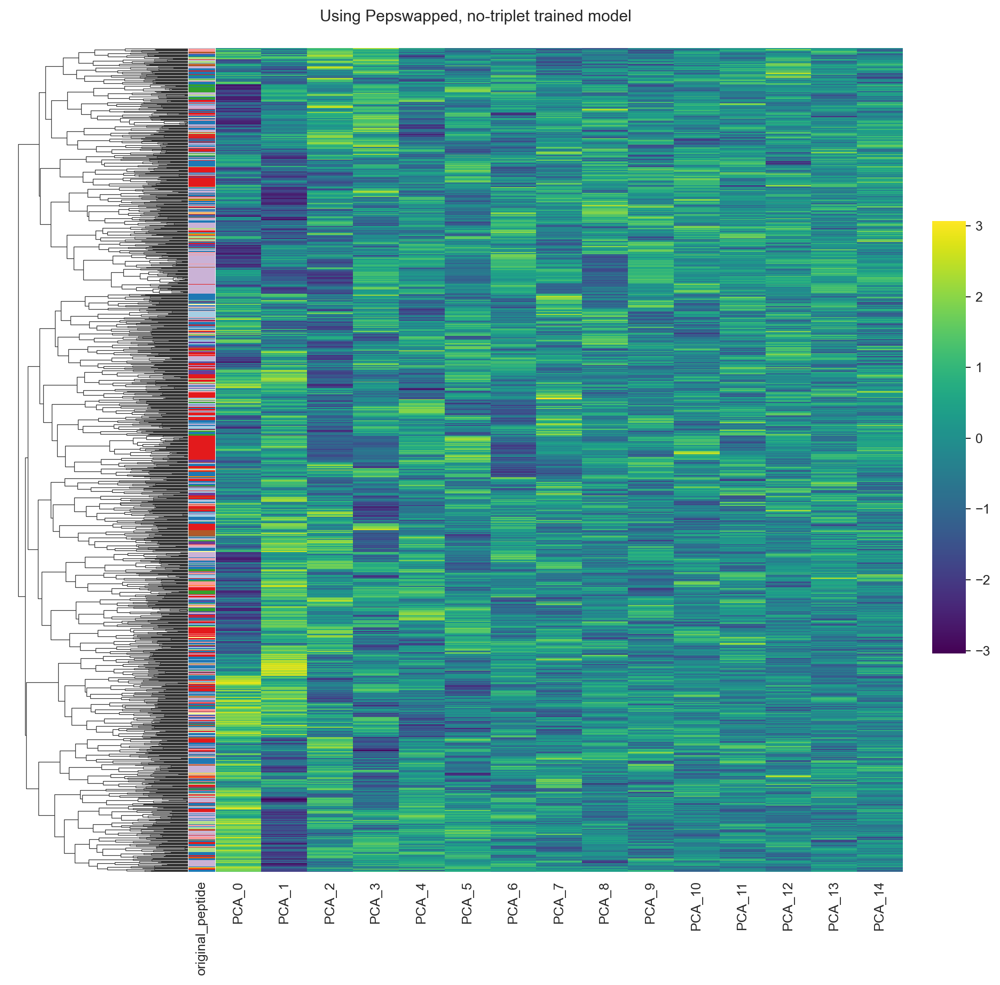

In [390]:
get_aggcluster_heatmap_plot(preds_nt, linkage='complete', distance_threshold= 0.063527, title='Using Pepswapped, no-triplet trained model')

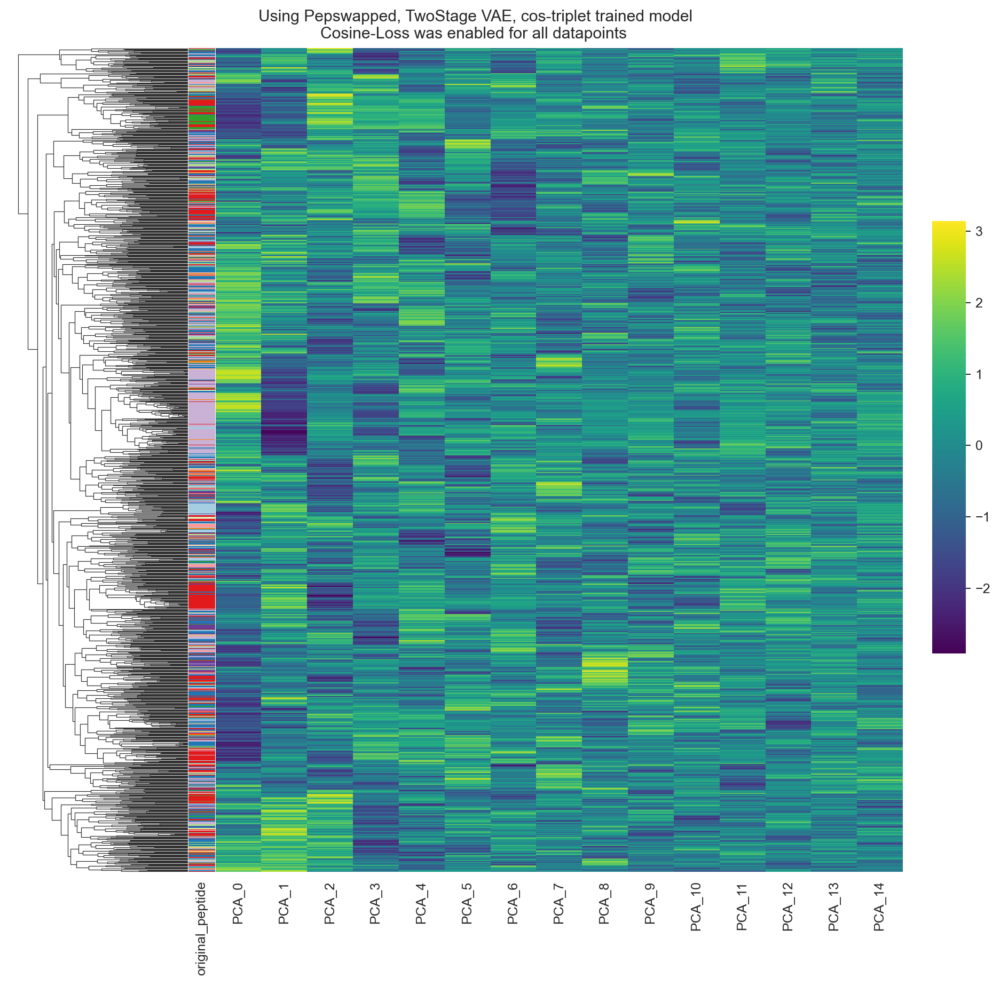

In [391]:
get_aggcluster_heatmap_plot(preds_tight, linkage='average', distance_threshold=0.448858, title='Using Pepswapped, TwoStage VAE, cos-triplet trained model\nCosine-Loss was enabled for all datapoints ')

## Do the same for 2 extra models

In [396]:
dataset_tcr.max_len_pep

0

In [ ]:
from src.sim_utils import make_dist_matrix, compute_cosine_distance
from src.datasets import FullTCRDataset
from src.train_eval import predict_model
# This one has pep but no PE
dataset_addpep = FullTCRDataset(pos_df, 7,8,22,6,7,23,12, True, 'BL50LO', -20)
loader_addpep = dataset_addpep.get_dataloader(2048, SequentialSampler)

vae_2st_ct = get_model('../output/240129_pepswapped/240126_PepSwapped_2stageFull_CosTrp_PosEncode_AddPep_1k25WU_3kEp_LowMarg_fold_1_KFold_1_240126_1430_PEPEP/').vae
vae_2st_nt = get_model('../output/240129_pepswapped/240126_PepSwapped_2stageFull_NoTrp_PosEncode_AddPep_1k25WU_3kEp_LowMarg_fold_1_KFold_1_240126_1430_PEPEP/').vae


In [9]:
preds_2st_ct = predict_model(vae_2st_ct, dataset_addpep, loader_addpep)
preds_2st_nt = predict_model(vae_2st_nt, dataset_addpep, loader_addpep)

valid_2st_ct = make_dist_matrix(preds_2st_ct.query('partition==1'))
valid_2st_nt = make_dist_matrix(preds_2st_nt.query('partition==1'))

In [402]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
# Do for 
# preds_2st_ct
# valid_2st_ct

features = preds_2st_ct.query('partition==1')

features = features[[z for z in features.columns if z.startswith('z_')]].values
sample = valid_2st_ct.copy()

results_2st_ct = []
for linkage in ['average', 'single', 'complete']:
    for t in tqdm(np.linspace(0.06, 0.5, 500)):
        clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
        predicted_hc = clustering.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)
        try:
            ch = round(ch_score(features, predicted_hc),5)
        except ValueError:
            continue
        try:
            db = round(db_score(features, predicted_hc),5)
        except ValueError:
            continue
        
        results_2st_ct.append([linkage, t, ch, db, 'hierarchical'])


results_2st_ct = pd.DataFrame(results_2st_ct, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
mms = MinMaxScaler()
results_2st_ct['CH_scaled'] = mms.fit_transform(results_2st_ct['CH_score'].values.reshape((-1,1)))
results_2st_ct['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results_2st_ct['DB_score'].values.reshape((-1,1)))
results_2st_ct['hmean'] = results_2st_ct.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
results_2st_ct['mean'] = results_2st_ct.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
display(results_2st_ct.sort_values('hmean', ascending=False).head(5))
display(results_2st_ct.sort_values('mean', ascending=False).head(5))
results_2st_ct.CH_score.max(), results_2st_ct.DB_score.min()

100%|██████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:16<00:00, 30.82it/s]


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
226,average,0.259279,79.43849,1.76006,hierarchical,0.467679,0.336751,0.39156,0.402215
225,average,0.258397,79.43849,1.76006,hierarchical,0.467679,0.336751,0.39156,0.402215
224,average,0.257515,79.43849,1.76006,hierarchical,0.467679,0.336751,0.39156,0.402215
223,average,0.256633,79.43849,1.76006,hierarchical,0.467679,0.336751,0.39156,0.402215
222,average,0.255752,79.43849,1.76006,hierarchical,0.467679,0.336751,0.39156,0.402215


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
309,average,0.332465,167.84119,2.10542,hierarchical,1.0,0.125242,0.222604,0.562621
352,average,0.370381,167.84119,2.10542,hierarchical,1.0,0.125242,0.222604,0.562621
340,average,0.359800,167.84119,2.10542,hierarchical,1.0,0.125242,0.222604,0.562621
341,average,0.360681,167.84119,2.10542,hierarchical,1.0,0.125242,0.222604,0.562621
342,average,0.361563,167.84119,2.10542,hierarchical,1.0,0.125242,0.222604,0.562621


(167.84119, 0.67708)

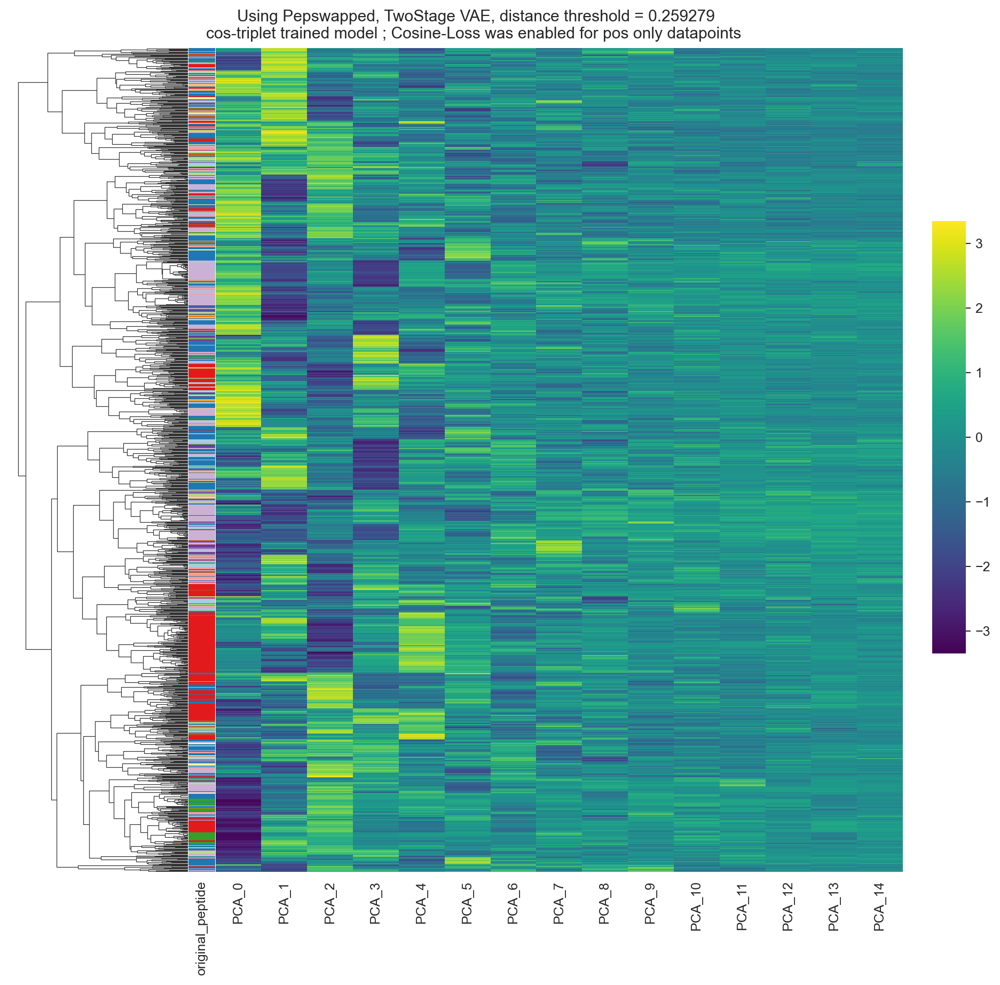

In [410]:
get_aggcluster_heatmap_plot(preds_2st_ct, linkage='average', distance_threshold=0.259279, title='Using Pepswapped, TwoStage VAE, distance threshold = 0.259279'\
                            '\ncos-triplet trained model ; Cosine-Loss was enabled for pos only datapoints ')


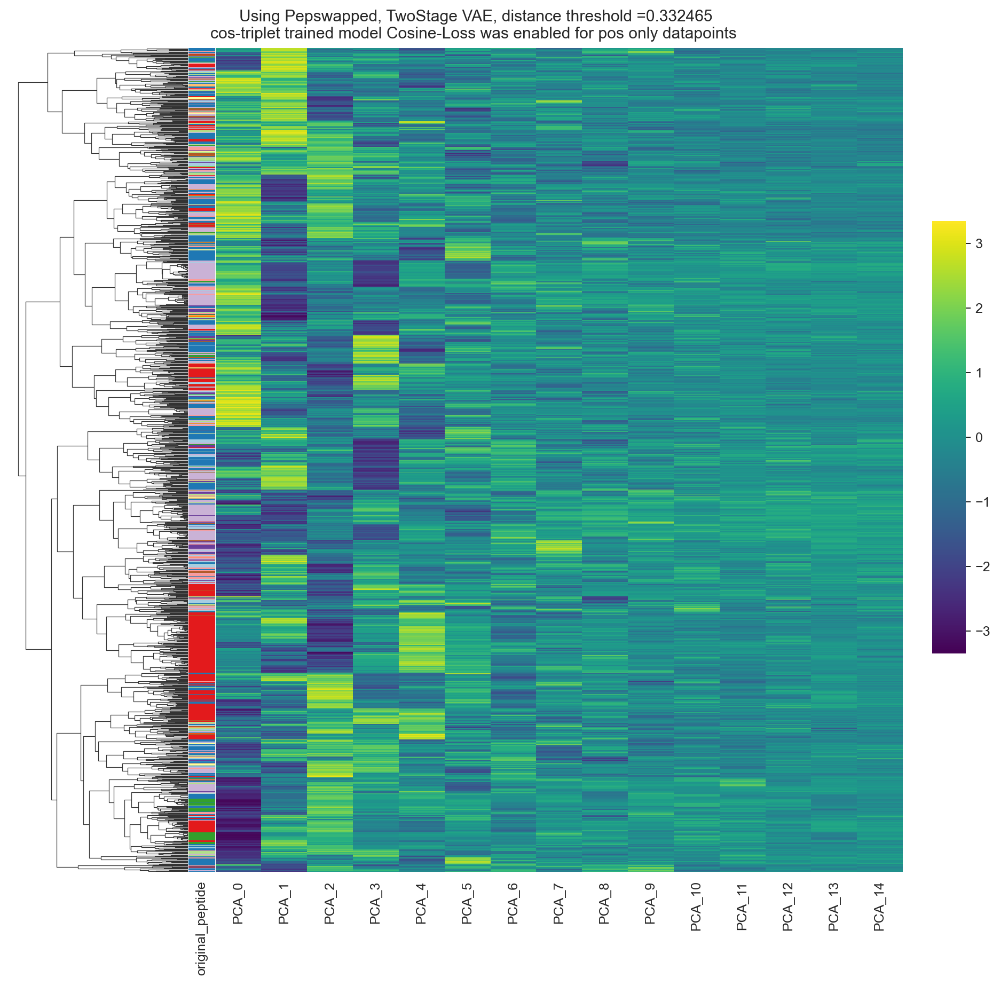

In [411]:
get_aggcluster_heatmap_plot(preds_2st_ct, linkage='average', distance_threshold=0.332465, title='Using Pepswapped, TwoStage VAE, distance threshold =0.332465'\
                            '\ncos-triplet trained model Cosine-Loss was enabled for pos only datapoints ')


In [403]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
# Do for 
# preds_2st_nt
# valid_2st_nt

features = preds_2st_nt.query('partition==1')

features = features[[z for z in features.columns if z.startswith('z_')]].values
sample = valid_2st_nt.copy()

results_2st_nt = []
for linkage in ['average', 'single', 'complete']:
    for t in tqdm(np.linspace(0.06, 0.5, 500)):
        clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
        predicted_hc = clustering.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)
        try:
            ch = round(ch_score(features, predicted_hc),5)
        except ValueError:
            continue
        try:
            db = round(db_score(features, predicted_hc),5)
        except ValueError:
            continue
        
        results_2st_nt.append([linkage, t, ch, db, 'hierarchical'])


results_2st_nt = pd.DataFrame(results_2st_nt, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
mms = MinMaxScaler()
results_2st_nt['CH_scaled'] = mms.fit_transform(results_2st_nt['CH_score'].values.reshape((-1,1)))
results_2st_nt['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results_2st_nt['DB_score'].values.reshape((-1,1)))
results_2st_nt['hmean'] = results_2st_nt.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
results_2st_nt['mean'] = results_2st_nt.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
display(results_2st_nt.sort_values('hmean', ascending=False).head(5))
display(results_2st_nt.sort_values('mean', ascending=False).head(5))
results_2st_nt.CH_score.max(), results_2st_nt.DB_score.min()

100%|██████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:11<00:00, 42.30it/s]


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
129,average,0.173747,190.26173,1.68112,hierarchical,0.761514,0.420443,0.541768,0.590978
123,average,0.168457,190.26173,1.68112,hierarchical,0.761514,0.420443,0.541768,0.590978
131,average,0.175511,190.26173,1.68112,hierarchical,0.761514,0.420443,0.541768,0.590978
130,average,0.174629,190.26173,1.68112,hierarchical,0.761514,0.420443,0.541768,0.590978
128,average,0.172866,190.26173,1.68112,hierarchical,0.761514,0.420443,0.541768,0.590978


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
163,average,0.203727,247.80046,1.7639,hierarchical,1.0,0.369367,0.539471,0.684683
156,average,0.197555,247.80046,1.7639,hierarchical,1.0,0.369367,0.539471,0.684683
149,average,0.191383,247.80046,1.7639,hierarchical,1.0,0.369367,0.539471,0.684683
150,average,0.192265,247.80046,1.7639,hierarchical,1.0,0.369367,0.539471,0.684683
151,average,0.193146,247.80046,1.7639,hierarchical,1.0,0.369367,0.539471,0.684683


(247.80046, 0.74182)

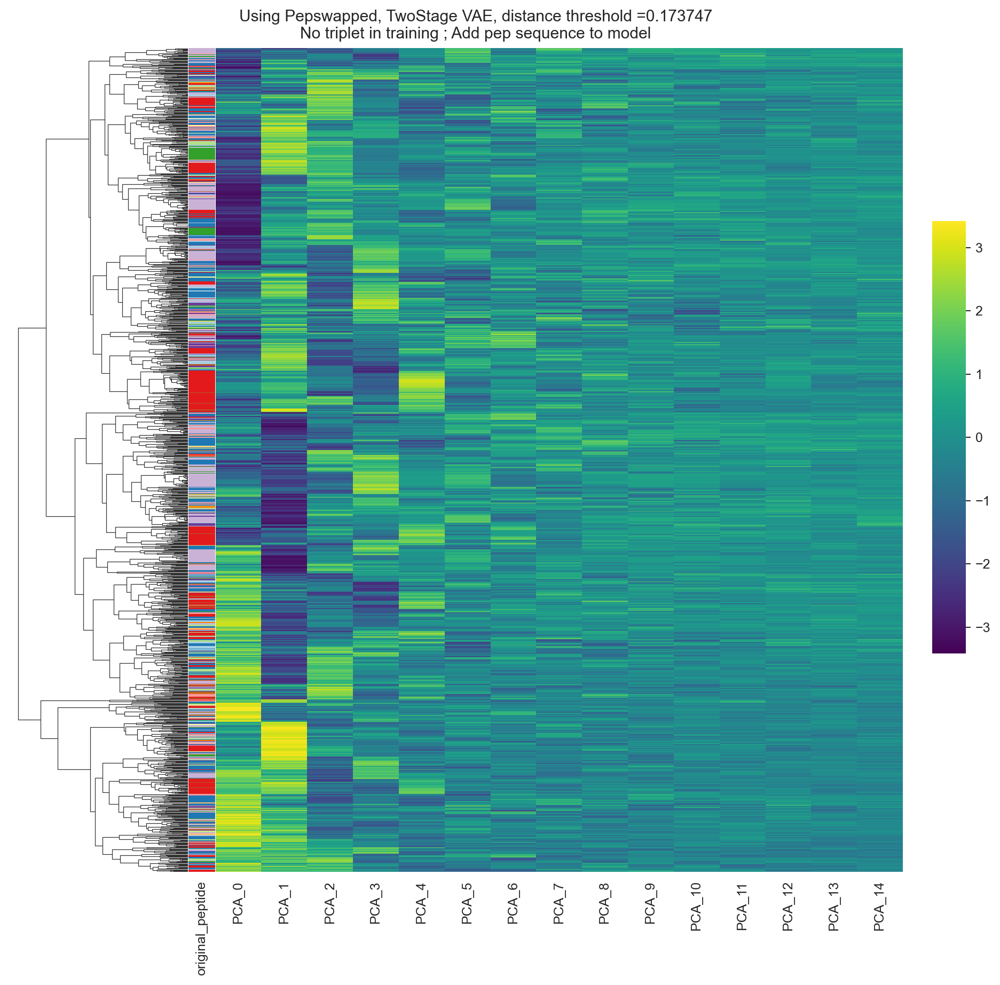

In [412]:
# 0.173747 and 0.203727

get_aggcluster_heatmap_plot(preds_2st_nt, linkage='average', distance_threshold=0.173747, title='Using Pepswapped, TwoStage VAE, distance threshold =0.173747'\
                            '\nNo triplet in training ; Add pep sequence to model')


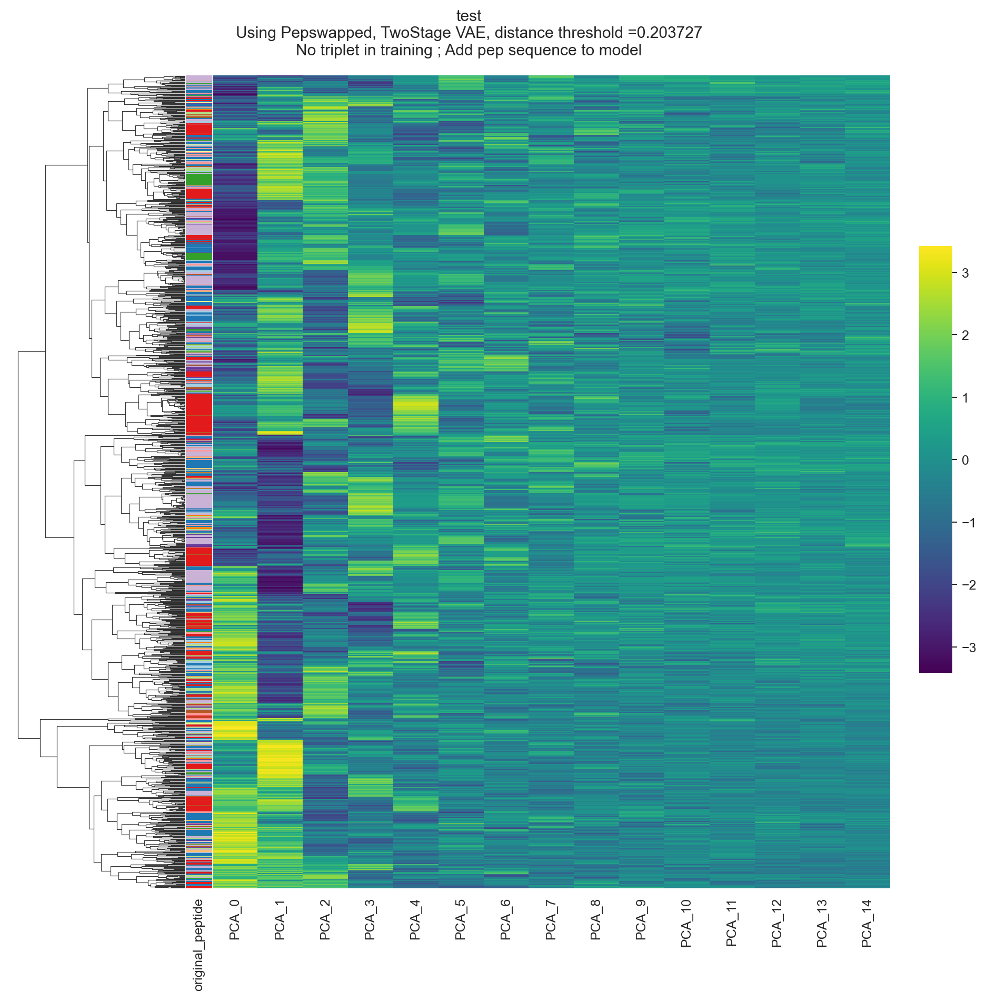

In [431]:

get_aggcluster_heatmap_plot(preds_2st_nt, linkage='average', distance_threshold=0.203727, title='test\nUsing Pepswapped, TwoStage VAE, distance threshold =0.203727'\
                            '\nNo triplet in training ; Add pep sequence to model')

## Redo and save the outputs properly



In [5]:
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
def get_linkage_matrix(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    return linkage_matrix


def get_aggcluster_heatmap_plot(preds, linkage='average', distance_threshold=0.457675, title='', fn='file'):
    sample = preds.query('partition==1')[['A1', 'A2', 'A3', 'B1', 'B2', 'B3']+[z for z in preds.columns if z.startswith('z_')]+['peptide', 'original_peptide']].sort_values('original_peptide')
    sample_dist_matrix = make_dist_matrix(sample)
    # Do agglomerative clustering with hyperparameters found earlier
    agg = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage=linkage, distance_threshold=distance_threshold)
    predicted_clusters = agg.fit_predict(sample_dist_matrix.drop(columns=['peptide','original_peptide']).values)
    linkage_matrix = get_linkage_matrix(agg)
    
    # Get a PCA of the features
    features = sample[[z for z in preds.columns if z.startswith('z_')]+['peptide', 'original_peptide']]
    pca = PCA(n_components=15)
    pca_feats = pd.DataFrame(pca.fit_transform(features.drop(columns=['peptide', 'original_peptide']).values), columns = [f'PCA_{i}' for i in range(pca.n_components_)])
    # Create the colour scheme
    features = features.rename(columns={'original_peptide':'label'})
    labels = features.pop('label')
    row_colors = {k:v for k,v in zip(labels.unique(), sns.color_palette('Paired', 26))}
    mapped_colors = labels.map(row_colors).reset_index(drop=True)
    
    g = sns.clustermap(pca_feats, col_cluster=False, row_linkage=linkage_matrix, col_linkage=None, row_colors=mapped_colors, cbar_pos=(.975, .35, .035, .45),
                   label=True, cmap = 'viridis', z_score=0, dendrogram_ratio=(0.2, 0))
    fig = g.fig
    ax = g.ax_heatmap
    ax.set_yticklabels([])
    ax.set_yticks([])
    fig.suptitle(title, y=1.05)
    g.savefig(f'{fn}.png', dpi=180)

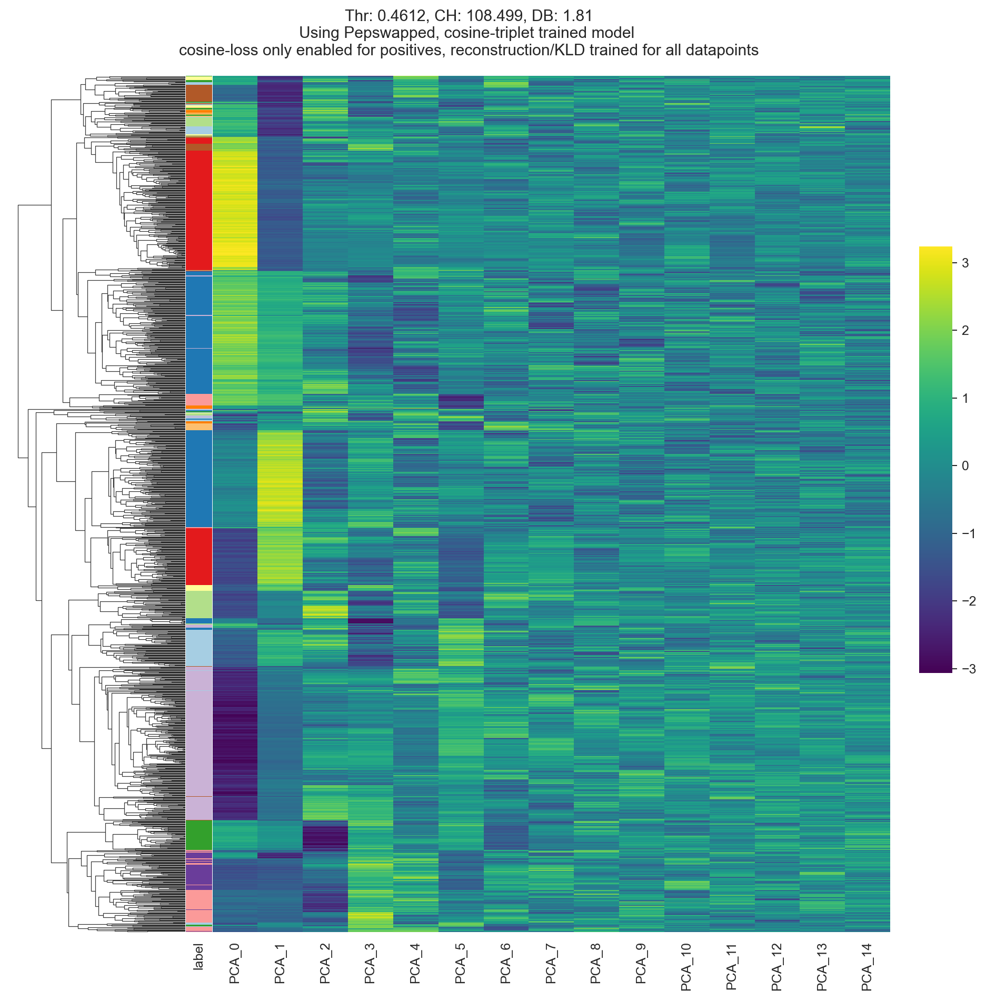

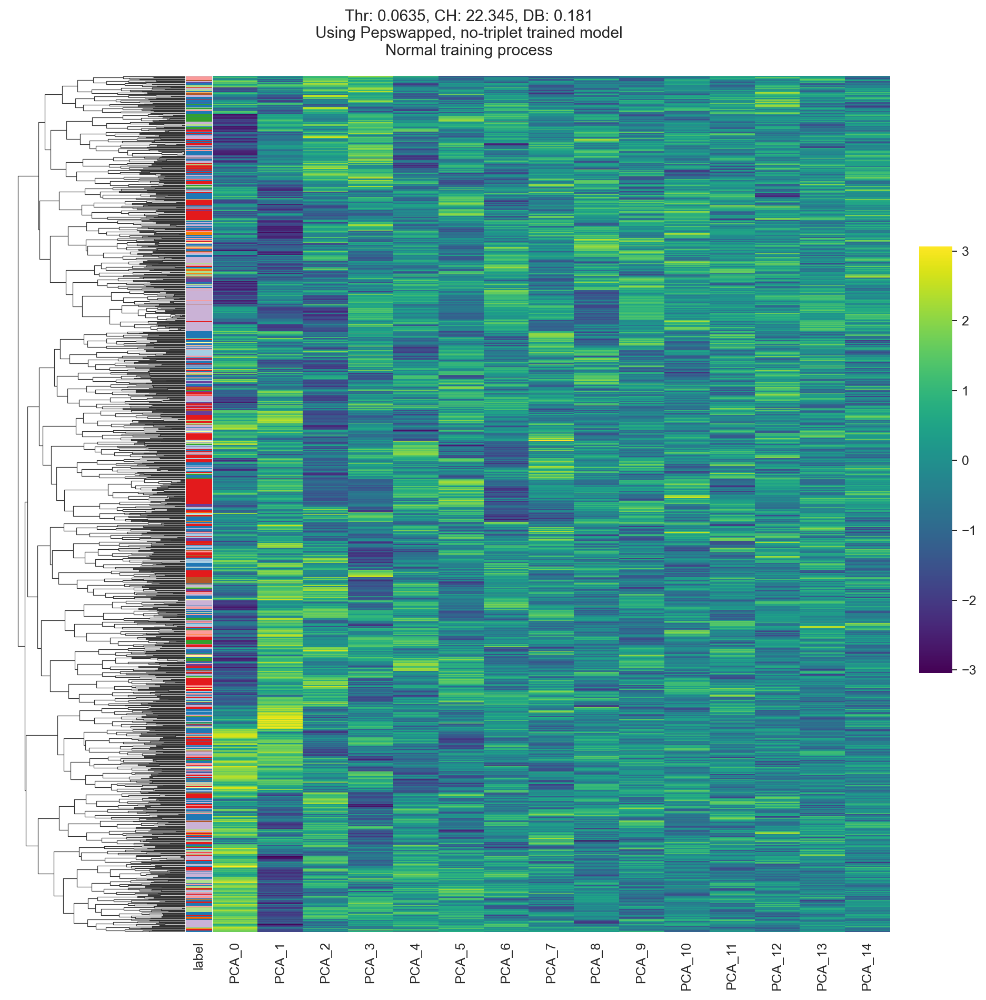

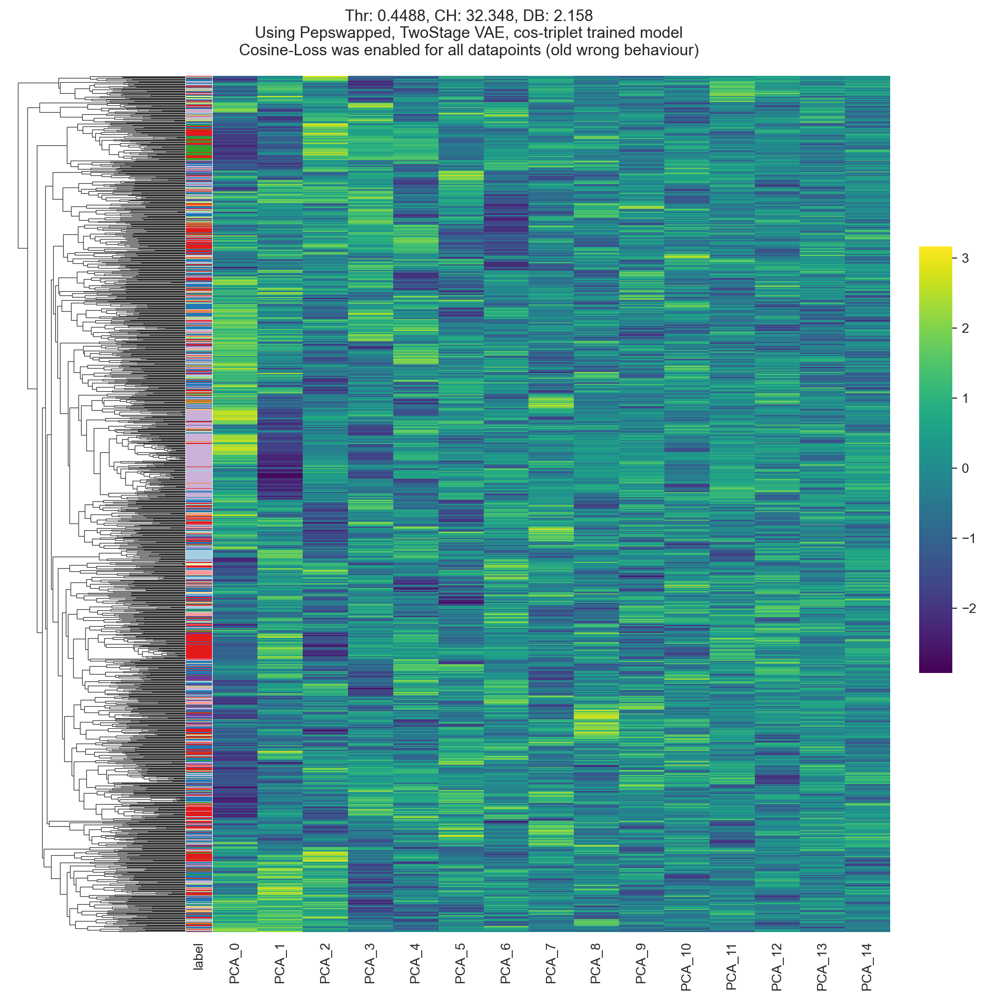

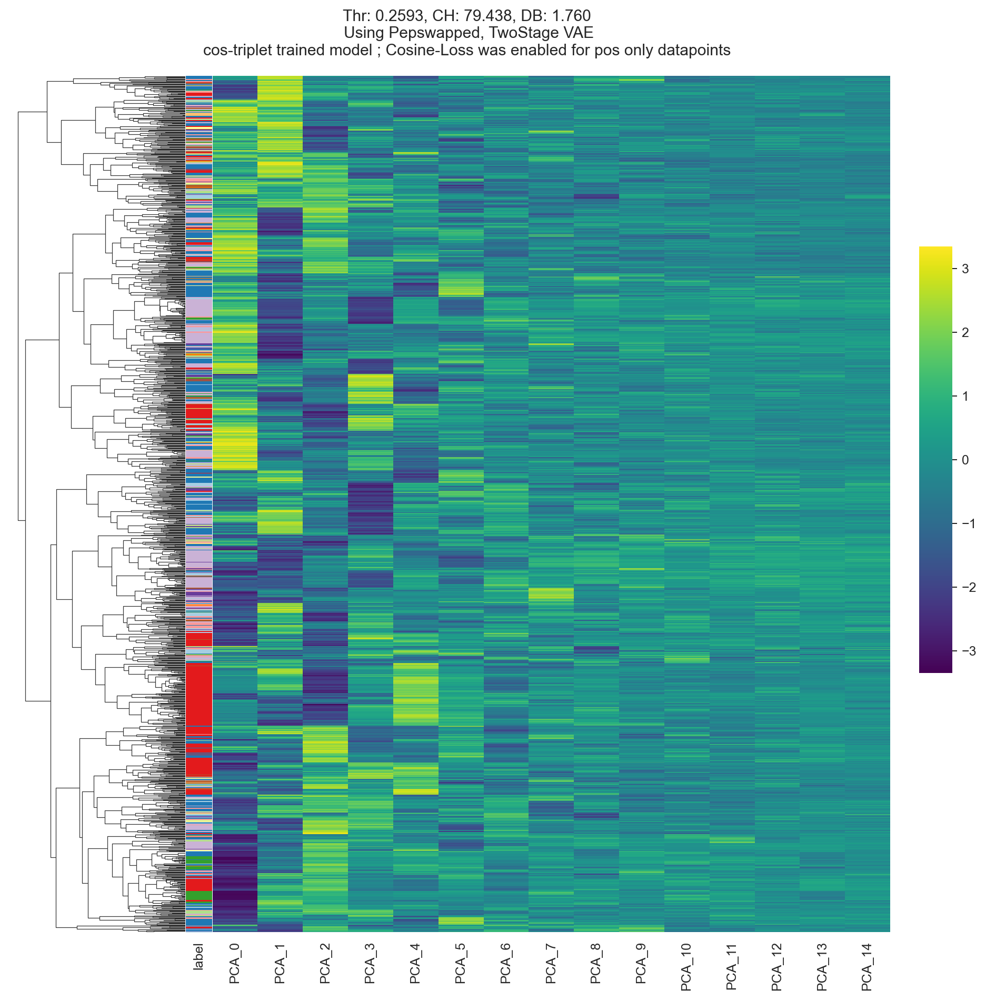

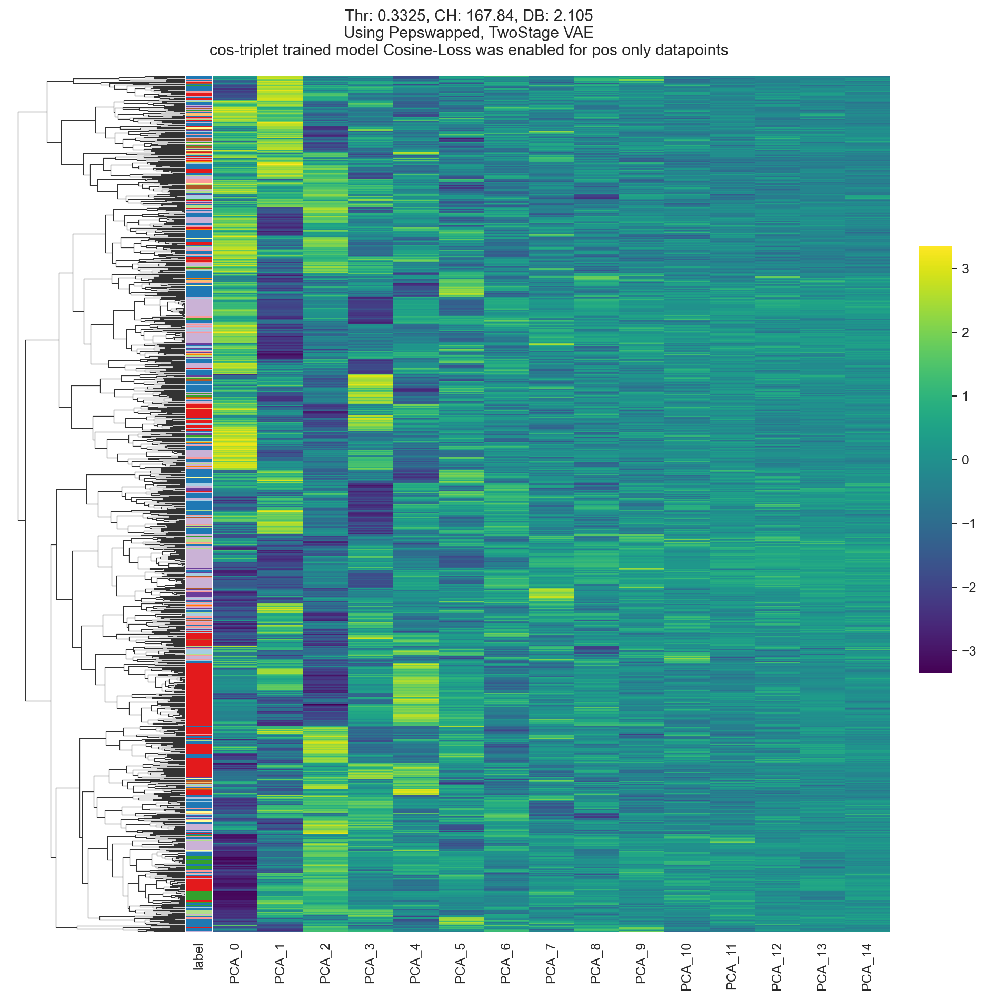

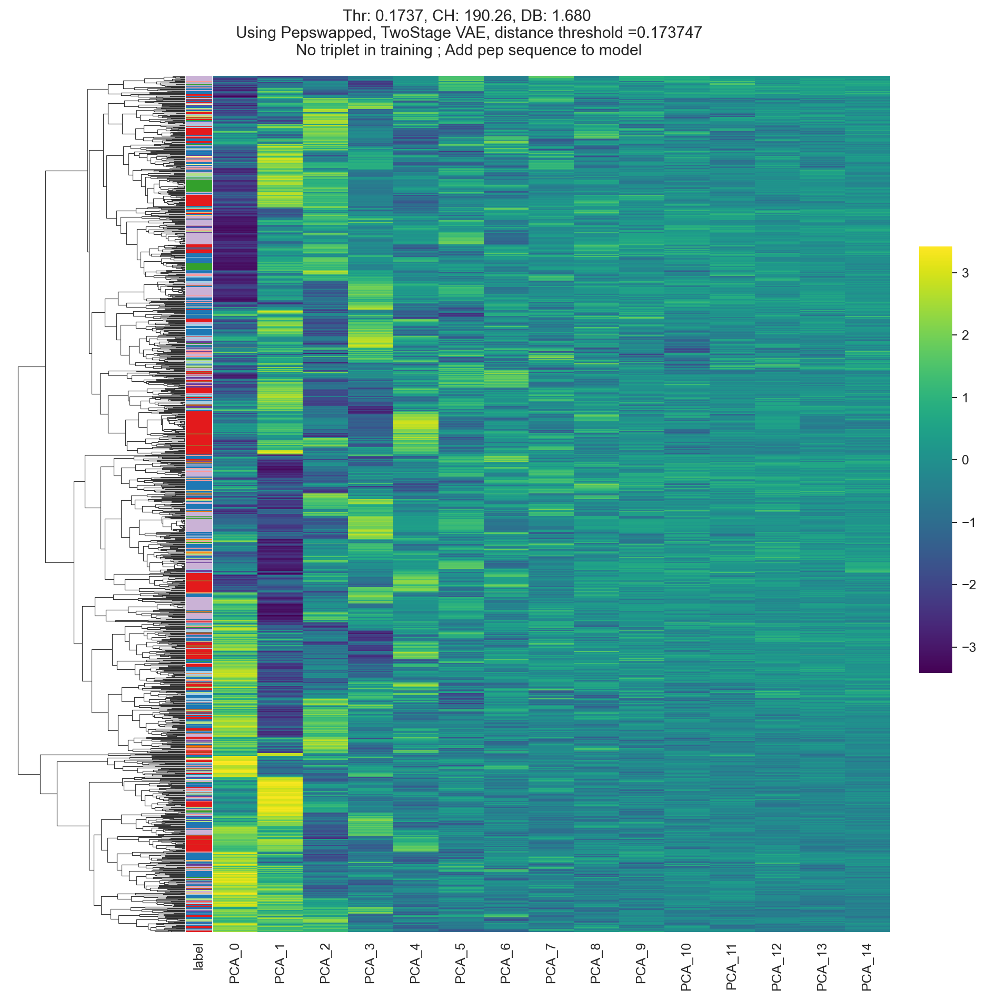

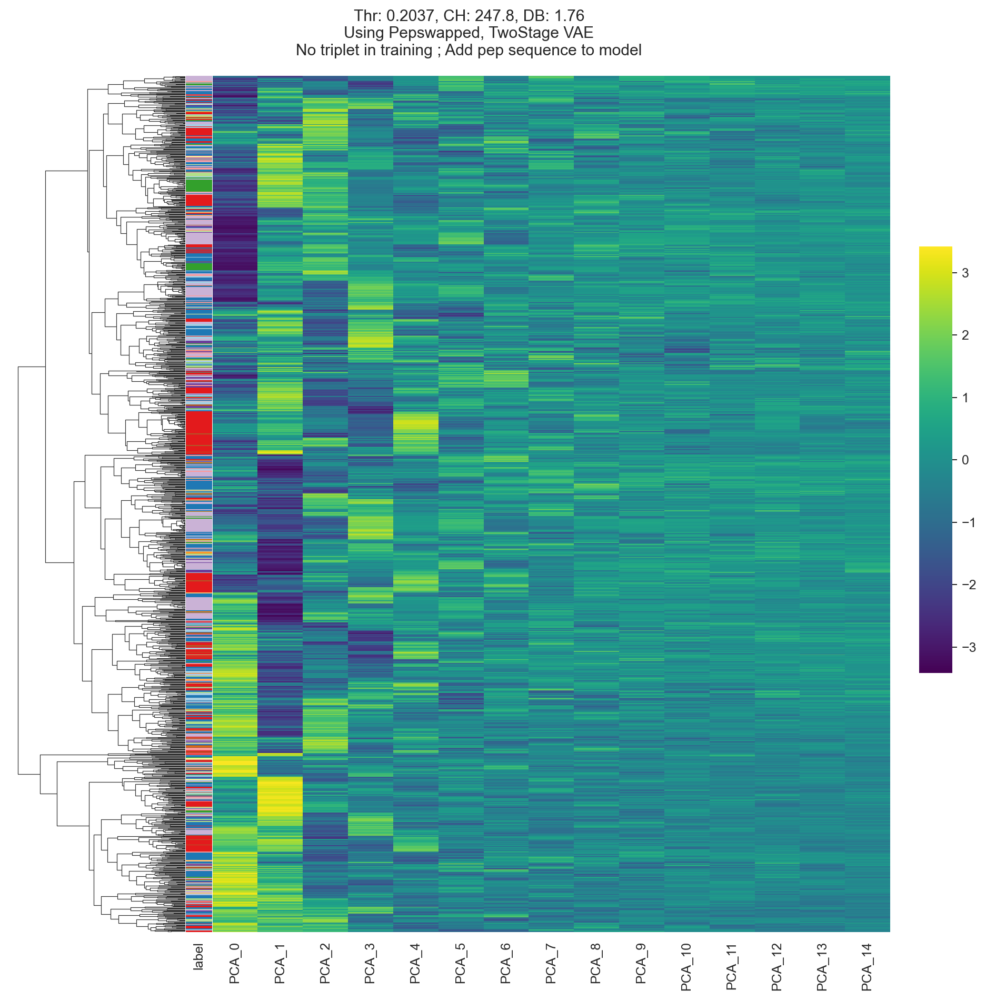

In [441]:

# 0.173747 and 0.203727
get_aggcluster_heatmap_plot(preds_ct, linkage='average', distance_threshold=0.461202,
                            title='Thr: 0.4612, CH: 108.499, DB: 1.81\n'
                                  'Using Pepswapped, cosine-triplet trained model \ncosine-loss only enabled for positives,'
                                  ' reconstruction/KLD trained for all datapoints',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_1stage_CosTrp.png')

get_aggcluster_heatmap_plot(preds_nt, linkage='complete', distance_threshold= 0.063527,
                            title='Thr: 0.0635, CH: 22.345, DB: 0.181\n'
                                  'Using Pepswapped, no-triplet trained model\nNormal training process',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_1stage_NoTrp.png')

get_aggcluster_heatmap_plot(preds_tight, linkage='average', distance_threshold=0.448858,
                            title='Thr: 0.4488, CH: 32.348, DB: 2.158\n'
                                  'Using Pepswapped, TwoStage VAE, cos-triplet trained model\n'
                                  'Cosine-Loss was enabled for all datapoints (old wrong behaviour)',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_OLD_2stage_CosTrp.png')

get_aggcluster_heatmap_plot(preds_2st_ct, linkage='average', distance_threshold=0.259279,
                            title='Thr: 0.2593, CH: 79.438, DB: 1.760 \n'
                                  'Using Pepswapped, TwoStage VAE'\
                            '\ncos-triplet trained model ; Cosine-Loss was enabled for pos only datapoints ',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_CosTrp_1.png')

get_aggcluster_heatmap_plot(preds_2st_ct, linkage='average', distance_threshold=0.332465,
                            title='Thr: 0.3325, CH: 167.84, DB: 2.105\n'
                                  'Using Pepswapped, TwoStage VAE'\
                            '\ncos-triplet trained model Cosine-Loss was enabled for pos only datapoints',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_CosTrp_2.png')

get_aggcluster_heatmap_plot(preds_2st_nt, linkage='average', distance_threshold=0.173747,
                            title='Thr: 0.1737, CH: 190.26, DB: 1.680 \n'
                            'Using Pepswapped, TwoStage VAE, distance threshold =0.173747'\
                            '\nNo triplet in training ; Add pep sequence to model',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_NoTrp_1.png')

get_aggcluster_heatmap_plot(preds_2st_nt, linkage='average', distance_threshold=0.203727,
                            title='Thr: 0.2037, CH: 247.8, DB: 1.76\n'
                            'Using Pepswapped, TwoStage VAE'\
                            '\nNo triplet in training ; Add pep sequence to model',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_NoTrp_2.png')



In [24]:
preds_2st_ct.groupby(['peptide'])['seq_acc'].mean()

peptide
ATDALMTGF       0.889253
AVFDRKSDAK      0.875119
CINGVCWTV       0.879321
CTELKLSDY       0.876875
DATYQRTRALVR    0.884926
ELAGIGILTV      0.885992
FEDLRLLSF       0.872307
FEDLRVLSF       0.855980
GILGFVFTL       0.903694
GLCTLVAML       0.906353
GPRLGVRAT       0.843039
HPVTKYIM        0.864242
IVTDFSVIK       0.906430
KLGGALQAK       0.875055
KSKRTPMGF       0.880556
LLWNGPMAV       0.898831
NLVPMVATV       0.877318
RAKFKQLL        0.904207
RFPLTFGWCF      0.894835
RLPGVLPRA       0.888953
RLRAEAQVK       0.884964
RPPIFIRRL       0.866108
SLFNTVATLY      0.895837
SPRWYFYYL       0.871547
VLFGLGFAI       0.881671
YLQPRTFLL       0.896593
Name: seq_acc, dtype: float64

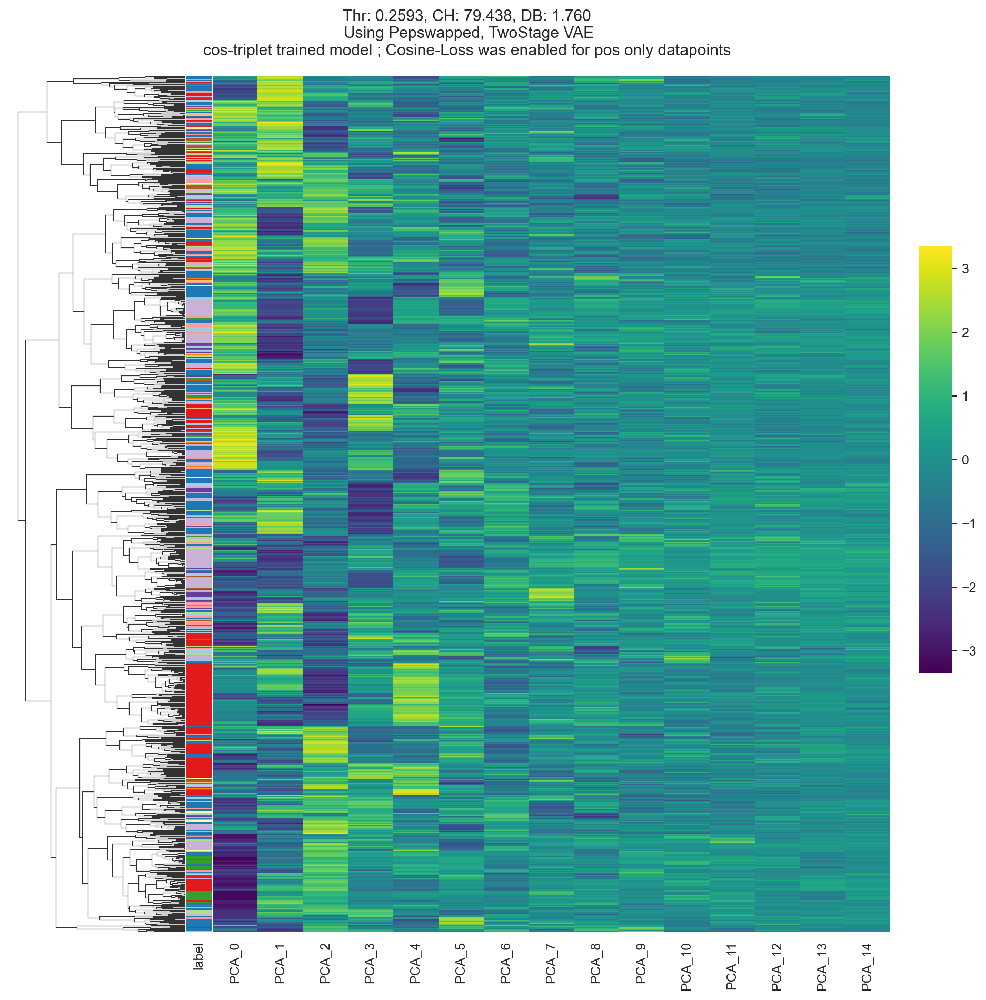

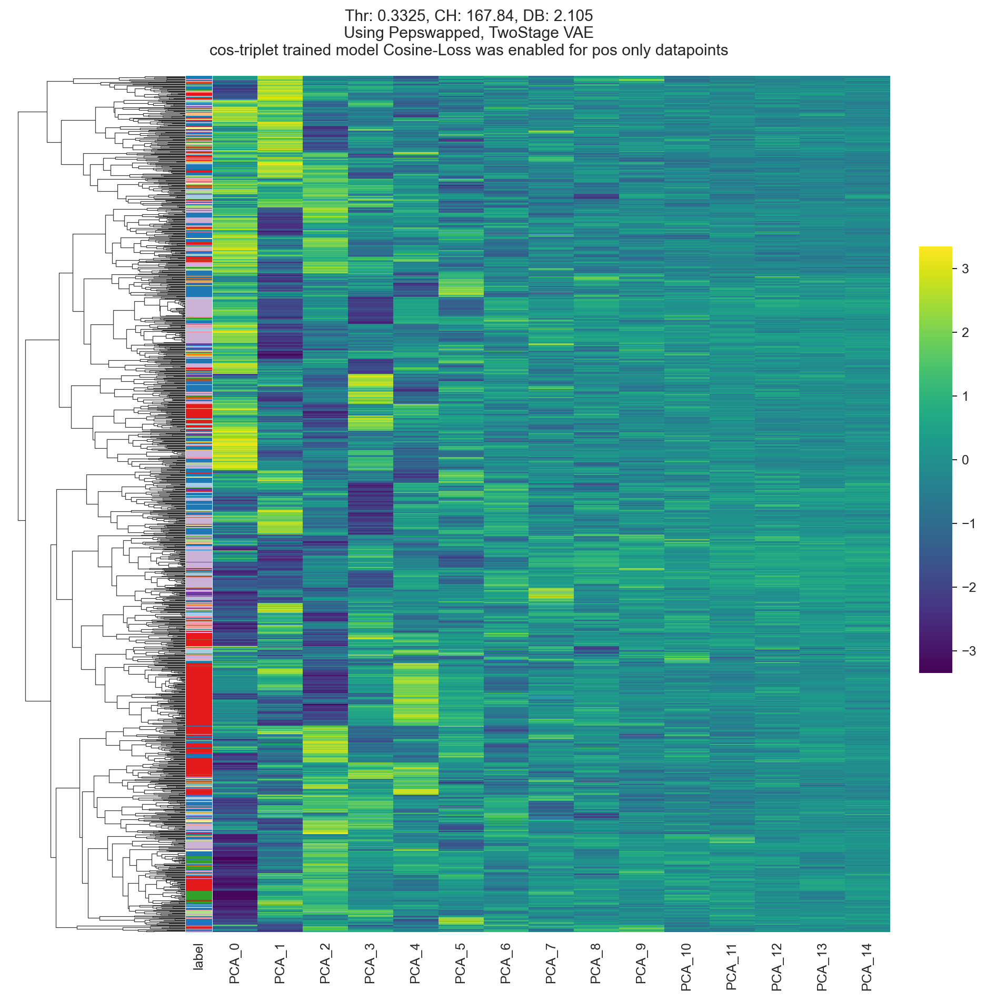

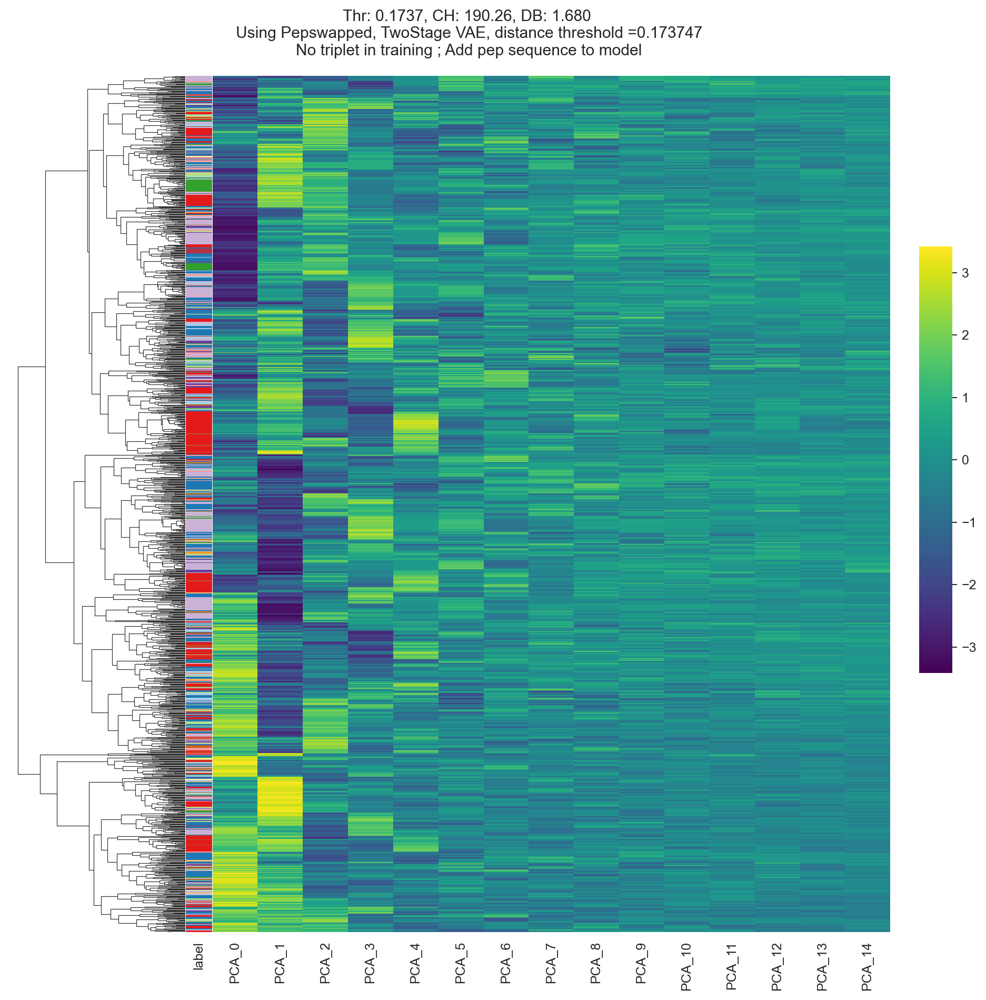

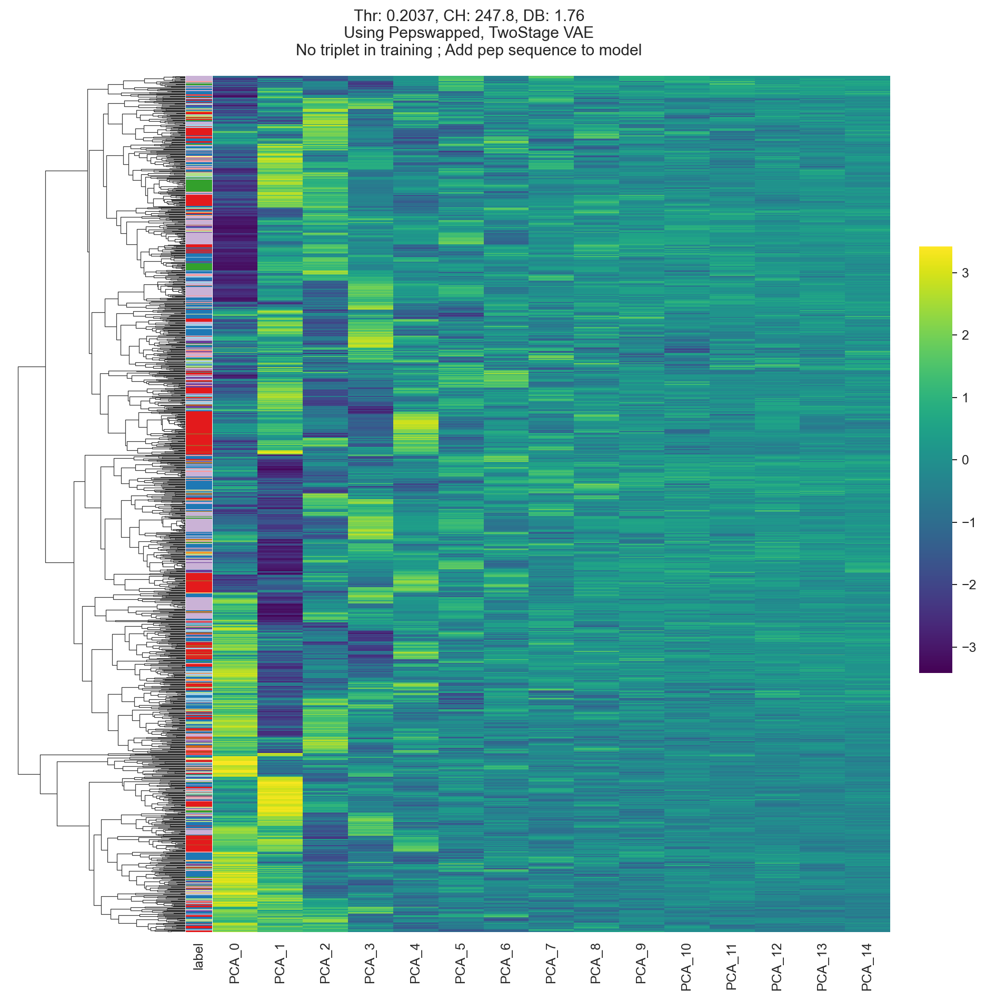

In [20]:
get_aggcluster_heatmap_plot(preds_2st_ct, linkage='average', distance_threshold=0.259279,
                            title='Thr: 0.2593, CH: 79.438, DB: 1.760 \n'
                                  'Using Pepswapped, TwoStage VAE'\
                            '\ncos-triplet trained model ; Cosine-Loss was enabled for pos only datapoints ',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_CosTrp_1.png')

get_aggcluster_heatmap_plot(preds_2st_ct, linkage='average', distance_threshold=0.332465,
                            title='Thr: 0.3325, CH: 167.84, DB: 2.105\n'
                                  'Using Pepswapped, TwoStage VAE'\
                            '\ncos-triplet trained model Cosine-Loss was enabled for pos only datapoints',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_CosTrp_2.png')

get_aggcluster_heatmap_plot(preds_2st_nt, linkage='average', distance_threshold=0.173747,
                            title='Thr: 0.1737, CH: 190.26, DB: 1.680 \n'
                            'Using Pepswapped, TwoStage VAE, distance threshold =0.173747'\
                            '\nNo triplet in training ; Add pep sequence to model',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_NoTrp_1.png')

get_aggcluster_heatmap_plot(preds_2st_nt, linkage='average', distance_threshold=0.203727,
                            title='Thr: 0.2037, CH: 247.8, DB: 1.76\n'
                            'Using Pepswapped, TwoStage VAE'\
                            '\nNo triplet in training ; Add pep sequence to model',
                            fn = '../output/240223_hierachical_clustering_heatmaps/PepSwap_NEW_2stage_NoTrp_2.png')


# custom algo tests

In [27]:
valid_ct.head(15)

,TRDTTYYRNSFDEQNAFLYNQGGKLISGHDYFNNNVPASSPGSRGNIQY,YGATPYYFSGDTLVAVGAPSTSGTYKYIMGHRAYSYEKLASSQDPGFGGGSYEQY,SSVPPYYTSAATLVAVKWSSNYKLTSQVTMANQGSEASVGSGDHGEQF,TRDTTYYRNSFDEQNALSEAGTGGSYIPTSGHTAFQGNSAASSGLEGAGDTQY,ATGYPSATKADDKALLNYGNNRLASGHVSFQNEAQASSLVRDRAYEQY,YGATPYYFSGDTLVAGPNNFGNEKLTMNHEYSMNVEVASSRGTGFNEQY,DSASNYIRSNVGEAARETSYDKVISGHNSFNNNVPASRKQGSDTGELF,SIFNTLYKAGELAGPSNTGKLIMGHRAYSYEKLAVLVDPYNEQF,DRGSQSIYSNGDAVNDQFYSGHNTYYREEEASSPGQLLMNTEAF,NSASDYIRSNMDKADMNRDDKIILNHDASQIVNDASSIRAAYEQY,...,SVFSSVVTGGEVAGGGSQGNLISGDLSYYNGEEASSYTGTEAF,DRGSQSIYSNGDAVNTGGNNRLALNHDASQIVNDASRGQPNTGELF,TSGFNGNVLDGLAVVANDYKLSMRHNASNTAGTASSDSIQSTDTQY,DSAIYNIQSSQRESPCKPEANNLFLNHDASQIVNDASSTHSGNQPQH,TTLSNLVKSGEVAGPIDGGSQGNLILNHDASQIVNDASSILSNQPQH,TSGFNGNVLDGLAVGSWGKLQLNHDASQIVNDASSARAGITQY,SVFSSVVTGGEVAGGGSQGNLILNHDASQIVNDASSARSTGELF,SIFNTLYKAGELAGQLAGGSQGNLILGHNAYSLEERASSQERGGKWAYEQY,peptide,original_peptide
TRDTTYYRNSFDEQNAFLYNQGGKLISGHDYFNNNVPASSPGSRGNIQY,0.000000,0.784137,0.137610,0.663871,0.534186,0.326519,0.143629,0.739271,0.820573,0.743524,...,0.762743,0.177001,0.698134,0.679102,0.768855,0.749163,0.741720,0.807450,RAKFKQLL,RAKFKQLL
YGATPYYFSGDTLVAVGAPSTSGTYKYIMGHRAYSYEKLASSQDPGFGGGSYEQY,0.784137,0.000000,0.756856,0.427292,0.542724,0.538621,0.682811,0.507270,0.496206,0.523435,...,0.581703,0.737662,0.550323,0.596369,0.546677,0.566334,0.547138,0.395543,RFPLTFGWCF,RFPLTFGWCF
SSVPPYYTSAATLVAVKWSSNYKLTSQVTMANQGSEASVGSGDHGEQF,0.137610,0.756856,0.000000,0.728749,0.585990,0.311027,0.149661,0.721121,0.785854,0.715927,...,0.732803,0.213607,0.767410,0.677302,0.712253,0.746001,0.744619,0.779751,RAKFKQLL,RAKFKQLL
TRDTTYYRNSFDEQNALSEAGTGGSYIPTSGHTAFQGNSAASSGLEGAGDTQY,0.663871,0.427292,0.728749,0.000000,0.491668,0.605103,0.693138,0.388690,0.636870,0.301318,...,0.386530,0.703025,0.271762,0.228248,0.281042,0.295792,0.370085,0.347262,GILGFVFTL,GILGFVFTL
ATGYPSATKADDKALLNYGNNRLASGHVSFQNEAQASSLVRDRAYEQY,0.534186,0.542724,0.585990,0.491668,0.000000,0.380810,0.547825,0.548606,0.366289,0.517833,...,0.474018,0.587299,0.512393,0.545336,0.512777,0.488006,0.511408,0.522410,AVFDRKSDAK,AVFDRKSDAK
YGATPYYFSGDTLVAGPNNFGNEKLTMNHEYSMNVEVASSRGTGFNEQY,0.326519,0.538621,0.311027,0.605103,0.380810,0.000000,0.326986,0.578583,0.494247,0.547787,...,0.598392,0.302316,0.626772,0.572913,0.567819,0.668983,0.593013,0.649893,KLGGALQAK,KLGGALQAK
DSASNYIRSNVGEAARETSYDKVISGHNSFNNNVPASRKQGSDTGELF,0.143629,0.682811,0.149661,0.693138,0.547825,0.326986,0.000000,0.683254,0.746673,0.682948,...,0.714772,0.164929,0.711241,0.668341,0.720118,0.727680,0.718690,0.722048,RAKFKQLL,RAKFKQLL
SIFNTLYKAGELAGPSNTGKLIMGHRAYSYEKLAVLVDPYNEQF,0.739271,0.507270,0.721121,0.388690,0.548606,0.578583,0.683254,0.000000,0.417121,0.149724,...,0.104748,0.700457,0.248542,0.221639,0.171124,0.257619,0.082034,0.232704,GILGFVFTL,GILGFVFTL
DRGSQSIYSNGDAVNDQFYSGHNTYYREEEASSPGQLLMNTEAF,0.820573,0.496206,0.785854,0.636870,0.366289,0.494247,0.746673,0.417121,0.000000,0.391289,...,0.448665,0.717966,0.388083,0.480427,0.548671,0.436705,0.426216,0.516804,ELAGIGILTV,ELAGIGILTV
NSASDYIRSNMDKADMNRDDKIILNHDASQIVNDASSIRAAYEQY,0.743524,0.523435,0.715927,0.301318,0.517833,0.547787,0.682948,0.149724,0.391289,0.000000,...,0.218120,0.656233,0.209942,0.154137,0.182723,0.169346,0.152139,0.280422,GILGFVFTL,GILGFVFTL


In [49]:
threshold = 0.2
sample = torch.from_numpy(valid_ct.head(25)[[x for i,x in enumerate(valid_ct.columns[:25])]].values)
sorted, indices = sample.sort(dim=1)
thresholded_dists = sorted[sorted<=threshold]
thresholded_idxs = indices[sorted<=threshold]

In [50]:
import torch

threshold = 0.2
sorted, indices = sample.sort(dim=1)

# Create a mask for values below the threshold
mask = sorted >= threshold

# Set values below the threshold to some arbitrary value (e.g., -1)
sorted.masked_fill_(mask, -1)
indices.masked_fill_(mask, -1)

# Get the thresholded distances and indices
thresholded_dists = sorted[sorted != -1]
thresholded_idxs = indices[indices != -1]

# Check the result
print(thresholded_dists)
print(thresholded_idxs)


tensor([0.0000, 0.1376, 0.1436, 0.0000, 0.0000, 0.1376, 0.1497, 0.0000, 0.0000,
        0.0000, 0.1571, 0.1745, 0.0000, 0.1436, 0.1497, 0.0000, 0.1497, 0.1674,
        0.0000, 0.0000, 0.1205, 0.1497, 0.0000, 0.0000, 0.1205, 0.1674, 0.0000,
        0.1404, 0.1745, 0.0000, 0.1493, 0.0000, 0.1493, 0.0000, 0.0000, 0.0494,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.1404, 0.1571, 0.0000, 0.0000,
        0.0494, 0.0000])
tensor([ 0,  2,  6,  1,  2,  0,  6,  3,  4,  5, 21, 12,  6,  0,  2,  7,  9, 11,
         8,  9, 11,  7, 10, 11,  9,  7, 12, 21,  5, 13, 14, 14, 13, 15, 16, 23,
        17, 18, 19, 20, 21, 12,  5, 22, 23, 16, 24])


In [51]:
indices

tensor([[ 0,  2,  6, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 2,  0,  6, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 3, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 4, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 5, 21, 12, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 6,  0,  2, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 7,  9, 11, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 8, -1, -1, -1, -1, -1, -1, -1, -1, -1,

In [ ]:
# Define "intra_cluster_distance" threshold (cos dist)
# Define "inter_cluster_distance" threshold (cos dist)
# --> Defines a radius of in, a radius of out
# Pick "n_init" of random points ?

#


# Seq Accuracy per chain (and maybe per position)

In [15]:
from src.data_processing import BL62FREQ_VALUES, BL50_VALUES, BL50, BL62FREQ

mldict = {'A1':7, 'A2':8, 'A3':22, 'B1':6,'B2':7,'B3':23,'peptide':12}

def acc(str1, str2):
    if len(str1)!=len(str2):
        return np.nan
    else:
        return sum([c1==c2 for c1, c2 in zip(str1, str2)])/len(str1)

def blsm_score(true, recon, blsm):
    # Here shouldn't make it depending on each position, otherwise scores would be inflated ;
    # Take the raw "mutation" score of the sequence
    # If same sequence --> return 100
    # else, return the raw summed score
    if len(true)!=len(recon):
        return np.nan
    else:
        if true==recon:
            return 10# return sum([blsm[c1][c2] for c1, c2 in zip(true, recon)]) / len(true)
        else:
            return sum([blsm[c1][c2] for c1, c2 in zip(true, recon) if c1!=c2])
    
def extract_chains(row, catcol, mldict, prefix):
    cat_chain = row[catcol]#.item()
    a1 = cat_chain[:mldict['A1']].rstrip('X')
    a2 = cat_chain[mldict['A1']:mldict['A1']+mldict['A2']].rstrip('X')
    a3 = cat_chain[mldict['A1']+mldict['A2']:mldict['A1']+mldict['A2']+mldict['A3']].rstrip('X')
    b1 = cat_chain[mldict['A1']+mldict['A2']+mldict['A3']:mldict['A1']+mldict['A2']+mldict['A3']+mldict['B1']].rstrip('X')
    b2 = cat_chain[mldict['A1']+mldict['A2']+mldict['A3']+mldict['B1']:mldict['A1']+mldict['A2']+mldict['A3']+mldict['B1']+mldict['B2']].rstrip('X')
    b3 = cat_chain[mldict['A1']+mldict['A2']+mldict['A3']+mldict['B1']+mldict['B2']:mldict['A1']+mldict['A2']+mldict['A3']+mldict['B1']+mldict['B2']+mldict['B3']].rstrip('X')
    if len(cat_chain) == sum([v for v in mldict.values()]):
        pep = cat_chain[mldict['A1']+mldict['A2']+mldict['A3']+mldict['B1']+mldict['B2']+mldict['B3']:].rstrip('X')
    else:
        pep = row['peptide']


    return {prefix+k:v for k,v in zip(mldict.keys(), [a1, a2, a3, b1, b2, b3, pep])}

    
def per_chain_acc(row, mldict):
    recon_chain = extract_chains(row, catcol='hat_reconstructed', mldict=mldict, prefix='')    
    true_chain = extract_chains(row, catcol='true_reconstructed', mldict=mldict, prefix='')
    return {k+'_acc': acc(recon_chain[k], true_chain[k]) for k in mldict}

def per_chain_blsm(row, mldict, blsm):
    recon_chain = extract_chains(row, catcol='hat_reconstructed', mldict=mldict, prefix='')    
    true_chain = extract_chains(row, catcol='true_reconstructed', mldict=mldict, prefix='')
    return {k+'_blsm': blsm_score(recon_chain[k], true_chain[k], blsm) for k in mldict}
    
def get_cdrpep_recon_accs(df, mldict, blsm=BL50):
    # for k in mldict.keys():
    #     df[f'{k}_len'] = df[k].apply(len)
    # pep_order = df.groupby(['peptide']).agg(count=('B3','count')).sort_values('count', ascending=False).index
    reconstructed = df.apply(extract_chains, catcol='hat_reconstructed', mldict=mldict, prefix='rec_', axis=1, result_type='expand')
    true = df[mldict.keys()]
    accs = df.apply(per_chain_acc, mldict=mldict, axis=1, result_type='expand').rename(columns={'peptide_acc':'pep_acc'})
    blsms = df.apply(per_chain_blsm, mldict=mldict, blsm=blsm, axis=1, result_type='expand').rename(columns={'peptide_blsm':'pep_blsm'})
    cols = list(accs.columns) + list(blsms.columns)
    what_the_fuck = ['A1', 'rec_A1', 'A2', 'rec_A2', 'A3', 'rec_A3', 'B1', 'rec_B1', 'B2', 'rec_B2', 'B3', 'rec_B3', 'pep', 'rec_pep']+ cols
    return pd.concat([true, reconstructed, accs, blsms], axis=1).rename(columns={'peptide':'pep', 'rec_peptide':'rec_pep'})[what_the_fuck]

def get_per_pep_chain_accs(df, mldict,blsm=BL50):
    accs_df = get_cdrpep_recon_accs(df, mldict, blsm)
    counts = accs_df.groupby(['pep']).agg(count=('B3','count')).sort_values('count', ascending=False)
    pep_order = counts.index
    gb = accs_df.groupby(['pep']).agg(mean_a1 = ('A1_acc','mean'),
                                                     mean_a2 = ('A2_acc','mean'),
                                                     mean_a3 = ('A3_acc','mean'),
                                                     mean_b1 = ('B1_acc','mean'),
                                                     mean_b2 = ('B2_acc','mean'),
                                                     mean_b3 = ('B3_acc','mean'),
                                                     mean_pep= ('pep_acc','mean'),
                                                     mean_a3_blsm = ('A3_blsm', 'mean'),
                                                     mean_b3_blsm = ('B3_blsm', 'mean')).loc[pep_order]
    gb['n_pep'] = counts
    melted = accs_df.melt(id_vars=['pep'], 
                          value_vars=[x for x in accs_df.columns if x.endswith('_acc')], 
                          value_name = 'accuracy')
    return accs_df, gb, melted

def get_accs_make_plot(preds, mldict, blsm=BL50):
    hue_order = ['A1_acc', 'A2_acc', 'A3_acc', 'B1_acc', 'B2_acc', 'B3_acc', 'pep_acc']
    pep_order = preds.groupby('peptide').agg(count=('B3','count')).sort_values('count',ascending=False).index
    accs_df, gb, melted = get_per_pep_chain_accs(preds, mldict, blsm)
    sns.set_palette('gnuplot2', 7)
    f,a = plt.subplots(1,1, figsize=(20,5))
    sns.barplot(data=melted, x='pep', y='accuracy', hue='variable', hue_order=hue_order, order=pep_order, 
               width=0.7, capsize=.05, errwidth=0.35, dodge=True, ax=a, alpha=0.7)
    a.set_xticklabels([f'{x} ({n})' for x,n in zip(gb.index, gb['n_pep'])], rotation=45, ha='right')
    a.legend(bbox_to_anchor=(.5125,-.488))
    a.set_ylim([0.5, 1.005])
    return accs_df, gb, melted

In [7]:
from src.data_processing import BL50_VALUES, BL50, BL62FREQ_VALUES, BL62FREQ

In [296]:
from sklearn.preprocessing import MinMaxScaler
BL62_scaled = {}
for k,subdict in BL62FREQ.items():
    mms = MinMaxScaler()
    values = list(subdict.values())
    keys = list(subdict.keys())
    scaled_values = mms.fit_transform(np.array(values).reshape(-1, 1)).flatten()
    BL62_scaled[k] = {k1:v1 for k1,v1 in zip(keys, scaled_values)}

In [297]:
BL50_scaled = {}
for k,subdict in BL50.items():
    mms = MinMaxScaler()
    values = list(subdict.values())
    keys = list(subdict.keys())
    scaled_values = mms.fit_transform(np.array(values).reshape(-1, 1)).flatten()
    BL50_scaled[k] = {k1:v1 for k1,v1 in zip(keys, scaled_values)}

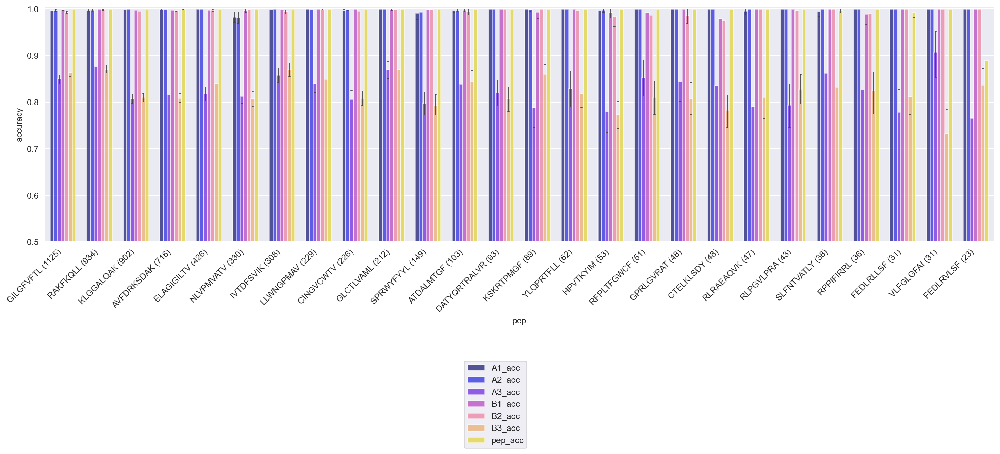

In [343]:
#preds 
accs_ct, gb_ct, melted_ct = get_accs_make_plot(preds_ct, mldict, BL50)

In [344]:
accs_ct

,A1,rec_A1,A2,rec_A2,A3,rec_A3,B1,rec_B1,B2,rec_B2,B3,rec_B3,pep,rec_pep,A1_acc,A2_acc,A3_acc,B1_acc,B2_acc,B3_acc,pep_acc,A1_blsm,A2_blsm,A3_blsm,B1_blsm,B2_blsm,B3_blsm,pep_blsm
0,KALYS,KALYS,LLKGGEQ,LLKGGEQ,GTEIGGGTSYGKLT,GTEIGGGTSYGKLT,MNHEY,MNHEY,SMNVEV,SMNVEV,ASGTETQY,ASSTETQY,KLGGALQAK,KLGGALQAK,1.0,1.0,1.000000,1.0,1.000000,0.875000,1.0,10.0,10.0,10.0,10.0,10.0,0.0,10.0
1,DRGSQS,DRGSQS,IYSNGD,IYSNGD,AVNPANARLM,AVNPTNAKLM,DFQATT,DFQATT,SNEGSKA,SNEGSKA,SARWGGGTDTQY,SARWGGGTDTQY,ELAGIGILTV,ELAGIGILTV,1.0,1.0,0.800000,1.0,1.000000,1.000000,1.0,10.0,10.0,3.0,10.0,10.0,10.0,10.0
2,TSGFNG,TSGFNG,NVLDGL,NVLDGL,AVGDDKII,AVGDDKLI,DFQATT,DFQATT,SNEGSKA,SNEGSKA,SARGLDRGTNEQY,SARDLNKGSNEQY,AVFDRKSDAK,AVFDRKSDAK,1.0,1.0,0.875000,1.0,1.000000,0.692308,1.0,10.0,10.0,2.0,10.0,10.0,6.0,10.0
3,DRGSQS,DRGSQS,IYSNGD,IYSNGD,AVTPGTYKYI,AVTSGTYKYI,LGHDT,LGHDT,YNNKEL,YNNKEL,ASSPGTSIFVAEQY,ASSPGTSIFTEEQY,ELAGIGILTV,ELAGIGILTV,1.0,1.0,0.900000,1.0,1.000000,0.857143,1.0,10.0,10.0,-1.0,10.0,10.0,-1.0,10.0
4,TRDTTYY,TRDTTYY,RNSFDEQN,RNSFDEQN,AFLYNQGGKLI,ALVYNKGGKLI,SGHDY,SGHDY,FNNNVP,FNNNVP,ASSPGSRGNIQY,ASSPGSKGDTQY,RAKFKQLL,RAKFKQLL,1.0,1.0,0.727273,1.0,1.000000,0.750000,1.0,10.0,10.0,4.0,10.0,10.0,4.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6348,TSENNYY,TSENNYY,QEAYKQQN,QEAYKQQN,AFMLGAGGTSYGKLT,AFMLGAGGTSYGKLT,LNHDA,LNHDA,SHIVND,SQIVND,ASSIGYYGYT,ASSLGMYGYT,GILGFVFTL,GILGFVFTL,1.0,1.0,1.000000,1.0,0.833333,0.800000,1.0,10.0,10.0,10.0,10.0,1.0,2.0,10.0
6349,DSASNY,DSASNY,IRSNVGE,IRSNVGE,AYGGSQGNLI,AAGGSQGNLI,LNHDA,LNHDA,SQIVND,SQIVND,ASSFRSSETQY,ASSFRSSETQY,GILGFVFTL,GILGFVFTL,1.0,1.0,0.900000,1.0,1.000000,1.000000,1.0,10.0,10.0,-2.0,10.0,10.0,10.0,10.0
6350,NSASDY,NSASDY,IRSNMDK,IRSNMDK,AENLGGGSQGNLI,AENLGGGSQGNLI,LNHDA,LNHDA,SQIVND,SQIVND,ASSTRATGELF,ASSTRTTGELF,GILGFVFTL,GILGFVFTL,1.0,1.0,1.000000,1.0,1.000000,0.909091,1.0,10.0,10.0,10.0,10.0,10.0,0.0,10.0
6351,SSVSVY,SSVSVY,YLSGSTLV,YLSGSTLV,AVGGDGGSQGNLI,AVGGDGGSQGNLI,LNHDA,LNHDA,SQIVND,SQIVND,ASSIRASGVEQF,ASSIRTSGYEQF,GILGFVFTL,GILGFVFTL,1.0,1.0,1.000000,1.0,1.000000,0.833333,1.0,10.0,10.0,10.0,10.0,10.0,-1.0,10.0


In [10]:
mla1 = 7
mla2 = 8
mla3 = 22
mlb1 = 6
mlb2 = 7
mlb3 = 23
vector = torch.ones([100, 37, 20])
weight_1 = torch.cat([torch.full([mla1+mla2, 1], 1/3), torch.full([mla3, 1], 1.33)], dim=0)
weight_2 = torch.cat([torch.full([mlb1+mlb2, 1], 1/3), torch.full([mlb3, 1], 1.33)], dim=0)
weights = torch.cat([weight_1, weight_2], dim=0)

In [346]:
accs_ct[['A3','rec_A3', 'B3', 'rec_B3', 'A3_acc','A3_blsm', 'B3_acc','B3_blsm']].query('A3_acc<1 and B3_acc<1')

,A3,rec_A3,B3,rec_B3,A3_acc,A3_blsm,B3_acc,B3_blsm
2,AVGDDKII,AVGDDKLI,SARGLDRGTNEQY,SARDLNKGSNEQY,0.875000,2.0,0.692308,6.0
3,AVTPGTYKYI,AVTSGTYKYI,ASSPGTSIFVAEQY,ASSPGTSIFTEEQY,0.900000,-1.0,0.857143,-1.0
4,AFLYNQGGKLI,ALVYNKGGKLI,ASSPGSRGNIQY,ASSPGSKGDTQY,0.727273,4.0,0.750000,4.0
5,APNSGGGADGLT,AANSGGGAEKLT,ASGKLAGVLSEQF,ASGSLAGVYSEQF,0.750000,-1.0,0.846154,-1.0
6,ASPGGGADGLT,AGSGGGADGLT,ASSATGTHSFGYT,ASSTTGTESYGYT,0.818182,-1.0,0.769231,4.0
...,...,...,...,...,...,...,...,...
6340,AAKLSDSSYKLI,AAKLKDSSYKLI,ASSFWGRNVDTQY,ASSFLGKEMDTQY,0.916667,0.0,0.692308,2.0
6341,VVSALLWGWELPTH,VVSAIIYGGGEKLT,ASSFLGSRAEAF,ASSFFGNETEAF,0.357143,-7.0,0.666667,2.0
6342,IVRDMEYGNKLV,IVRDLEYGNKLI,ASSLVVAGGPGTDTQY,ASSLVIAGGSGTNTQY,0.833333,7.0,0.812500,5.0
6346,AMISNTGGFKTI,AMLSNTGGFKTI,ASSFSVGENEKLF,ASSFSLGENNELF,0.916667,2.0,0.769231,2.0


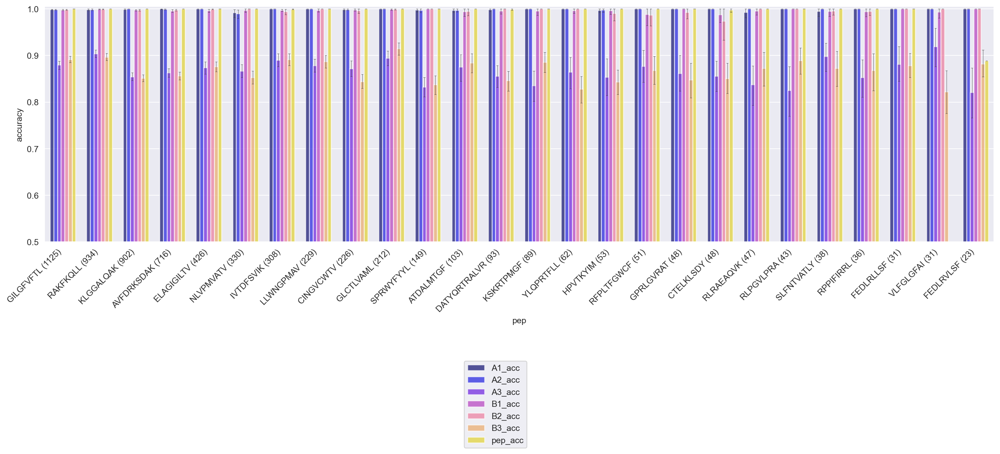

In [303]:
accs_nt, gb_nt, melted_nt = get_accs_make_plot(preds_nt, mldict)


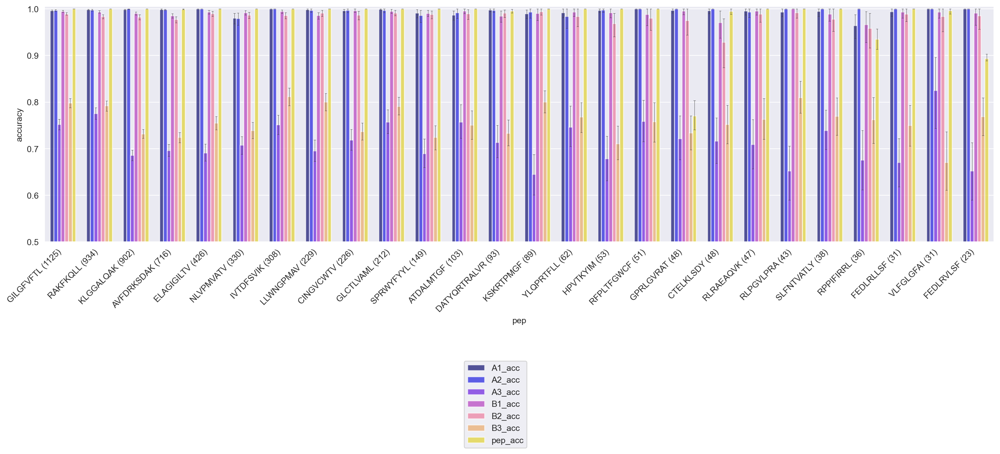

In [304]:
accs_2st_ct, gb_2st_ct, melted_2st_ct = get_accs_make_plot(preds_2st_ct, mldict)

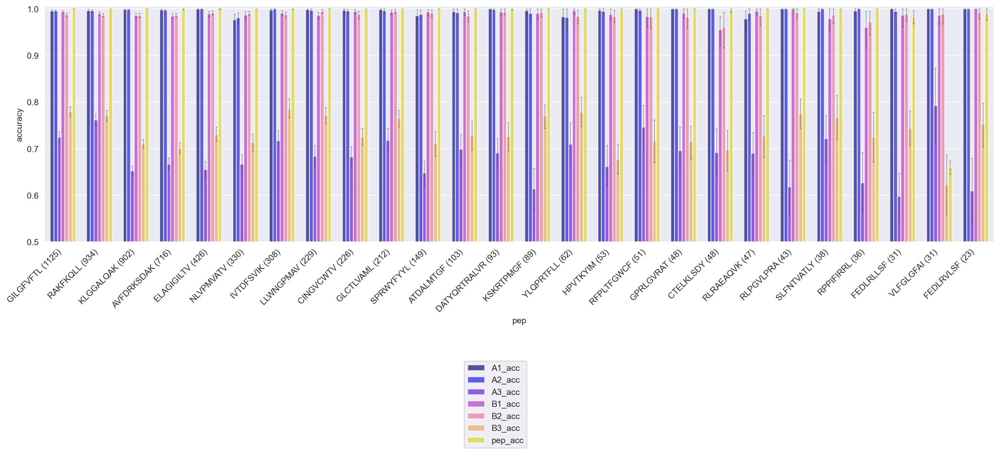

In [305]:
accs_2st_nt, gb_2st_nt, melted_2st_nt = get_accs_make_plot(preds_2st_nt, mldict)

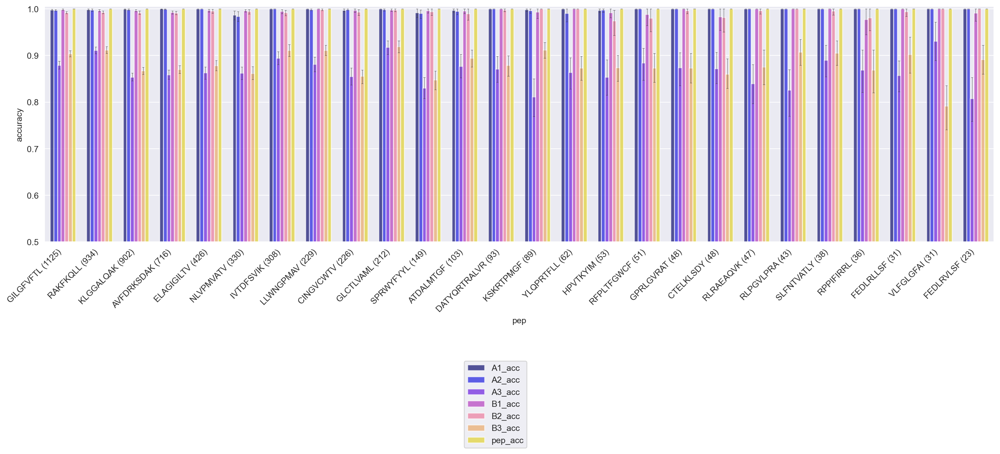

In [306]:
accs_tight, gb_tight, melted_tight = get_accs_make_plot(preds_tight, mldict)

# Model trained with positional weights


In [8]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
from sklearn.metrics import calinski_harabasz_score as ch_score, davies_bouldin_score as db_score
def make_dist_matrix(df, label_col='peptide',
                     seq_cols=('A1', 'A2', 'A3', 'B1', 'B2', 'B3'), cols=('peptide','original_peptide')):
    df['seq'] = df.apply(lambda x: ''.join([x[c] for c in seq_cols]), axis=1)
    seqs = df.seq.values
    # Getting dist matrix
    zcols = [z for z in df.columns if z.startswith("z_")]
    zs = torch.from_numpy(df[zcols].values)
    dist_matrix = pd.DataFrame(compute_cosine_distance(zs),
                               columns=seqs, index=seqs)
    dist_matrix = pd.merge(dist_matrix, df.set_index('seq')[list(cols)],
                           left_index=True, right_index=True)#.rename(columns={label_col: 'label'})
    return dist_matrix
    
def clustering_tune_plot_pipeline(preds, title='', fn='xd'):
    print('making distmatrix')
    dist = make_dist_matrix(preds)
    features = preds[[z for z in preds.columns if z.startswith('z_')]].values
    results = []
    print('tuning hp')
    for linkage in ['average', 'complete']:
        for t in tqdm(np.linspace(0.06, 0.5, 500)):
            clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
            predicted_hc = clustering.fit_predict(dist.drop(columns=['peptide', 'original_peptide']).values)
            try:
                ch = round(ch_score(features, predicted_hc),5)
            except ValueError:
                continue
            try:
                db = round(db_score(features, predicted_hc),5)
            except ValueError:
                continue
            
            results.append([linkage, t, ch, db, 'hierarchical'])

    results = pd.DataFrame(results, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
    mms = MinMaxScaler()
    results['CH_scaled'] = mms.fit_transform(results['CH_score'].values.reshape((-1,1)))
    results['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results['DB_score'].values.reshape((-1,1)))
    results['hmean'] = results.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
    results['mean'] = results.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
    best_h = results.sort_values('hmean', ascending=False).head(1)
    best_m = results.sort_values('mean', ascending=False).head(1)
    l1 = best_h['param1'].item()
    t1 = best_h['threshold'].astype(float).item()

    l2 = best_m['param1'].item()
    t2 = best_m['threshold'].astype(float).item()
    
    get_aggcluster_heatmap_plot(preds, linkage=l1, distance_threshold=t1, title=title, fn=fn+'_best_harm_mean')
    get_aggcluster_heatmap_plot(preds, linkage=l2, distance_threshold=t2, title=title, fn=fn+'_best_mean')
    return results

In [389]:
model = get_model('../output/240227_ONESTAGE_CosTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240227_1755_LMOR1/')
preds_new = predict_model(model, dataset_pep, loader_pep)
accs_new, gb_new, melted_new = get_accs_make_plot(preds_new, mldict);
results_new = clustering_tune_plot_pipeline(preds_new, title='New One Stage 0.5-1.5 weights', fn = 'new1st_LMOR1')
accs_new[['A3','rec_A3', 'B3', 'rec_B3', 'A3_acc','A3_blsm', 'B3_acc','B3_blsm']].query('A3_acc<1 and B3_acc<1')

making distmatrix
tuning hp


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [07:12<00:00,  1.16it/s]


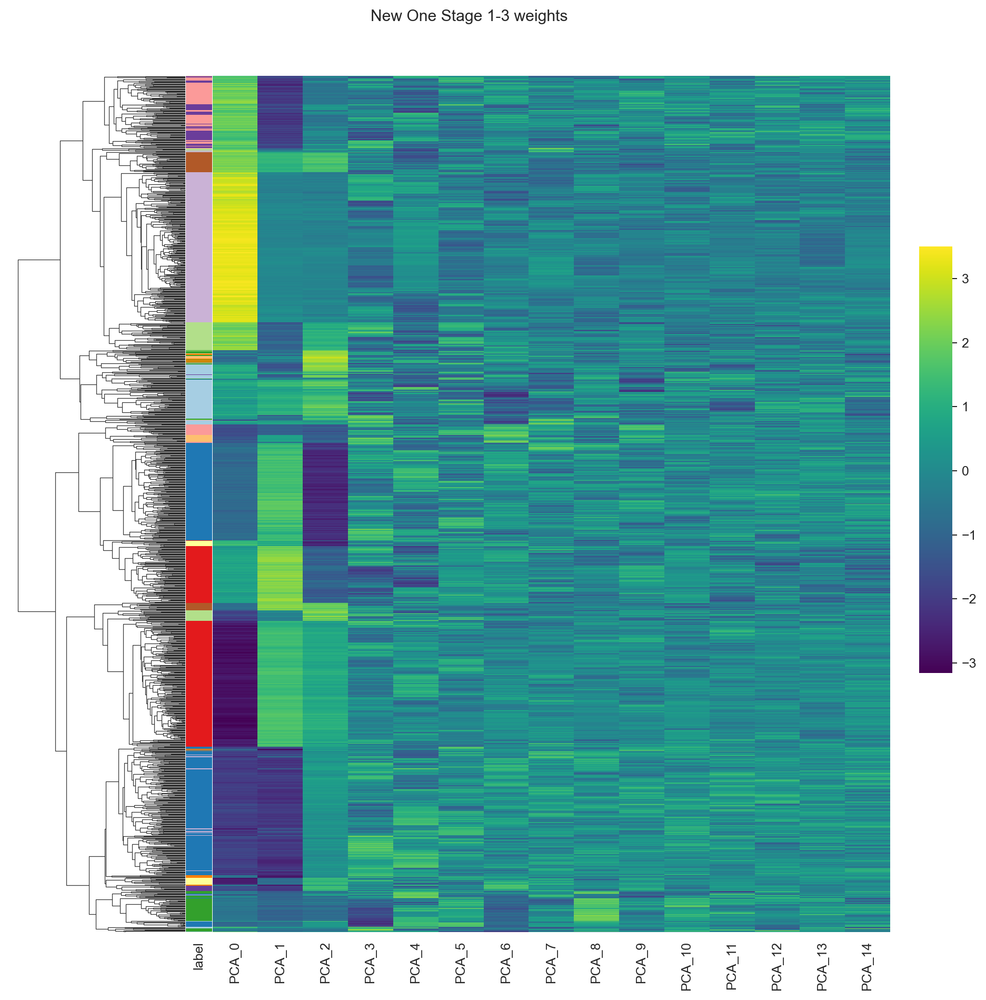

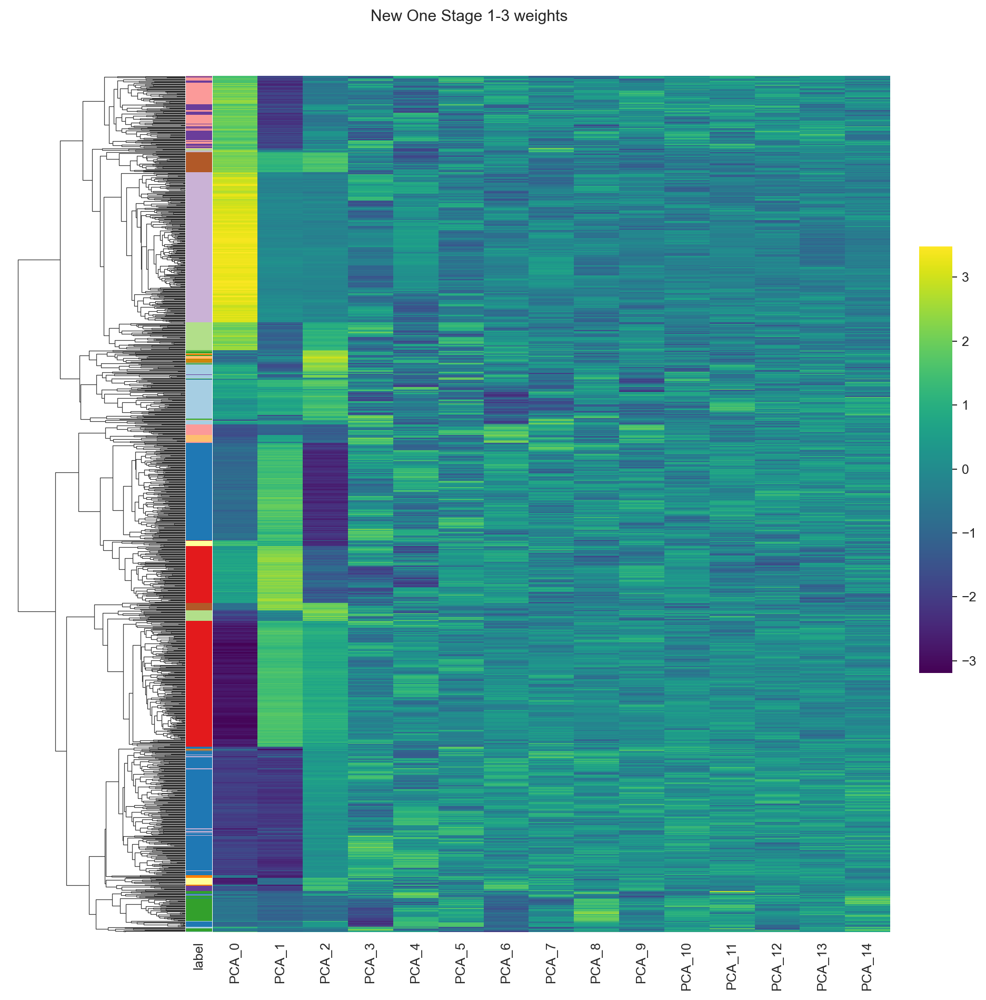

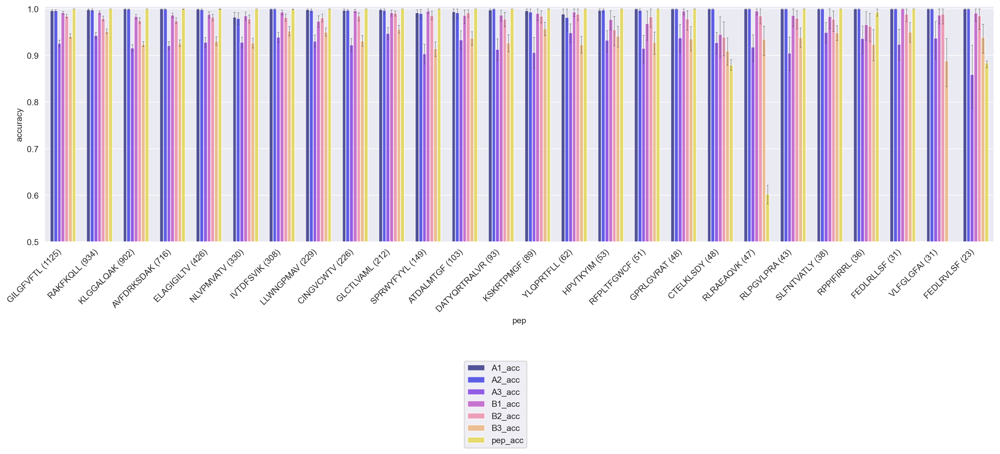

In [22]:
model_low_WD = get_model('../output/240227_ONESTAGE_CosTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240228_1310_LVTP1/')
preds_low_WD = predict_model(model_low_WD, dataset_pep, loader_pep)
results_low_WD = clustering_tune_plot_pipeline(preds_low_WD, title='New One Stage 1-3 weights', fn = 'new1st_diffweights_LVTP1')
accs_low_WD, gb_low_WD, melted_low_WD = get_accs_make_plot(preds_low_WD, mldict);


In [23]:
results_low_WD.sort_values('hmean',ascending=False).head()

,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
494,average,0.495591,1076.41653,1.63314,hierarchical,1.0,0.493323,0.660705,0.746661
495,average,0.496473,1076.41653,1.63314,hierarchical,1.0,0.493323,0.660705,0.746661
496,average,0.497355,1076.41653,1.63314,hierarchical,1.0,0.493323,0.660705,0.746661
497,average,0.498236,1076.41653,1.63314,hierarchical,1.0,0.493323,0.660705,0.746661
498,average,0.499118,1076.41653,1.63314,hierarchical,1.0,0.493323,0.660705,0.746661


,Indel,Standardize,add_pseudo_sequence
mean_auc,NaN,NaN,NaN
std_auc,NaN,NaN,NaN


In [29]:
sample = pos_df.sample(1000)
tmp = 'A3'
pos_df.query(f'{tmp} not in @sample.{tmp}.values')

,A1,A2,A3,B1,B2,B3,binder,peptide,original_peptide,TRAV,...,partition,Unnamed: 0,allele,origin,original_index,TRBV_gene,TRBJ_gene,TRA_CDR3,TRB_CDR3,len_q
0,KALYS,LLKGGEQ,GTEIGGGTSYGKLT,MNHEY,SMNVEV,ASGTETQY,1,KLGGALQAK,KLGGALQAK,TRAV30*01,...,2,32208.0,HLA-A*03:01,10x,2627.0,TRBV27,TRBJ2-5,CGTEIGGGTSYGKLTF,CASGTETQYF,5
1,DRGSQS,IYSNGD,AVNPANARLM,DFQATT,SNEGSKA,SARWGGGTDTQY,1,ELAGIGILTV,ELAGIGILTV,TRAV12-2*01,...,3,37123.0,HLA-A*02:01,10x,3820.0,TRBV20-1,TRBJ2-3,CAVNPANARLMF,CSARWGGGTDTQYF,6
3,DRGSQS,IYSNGD,AVTPGTYKYI,LGHDT,YNNKEL,ASSPGTSIFVAEQY,1,ELAGIGILTV,ELAGIGILTV,TRAV12-2*01,...,0,8197.0,HLA-A*02:01,10x,5933.0,TRBV3-1,TRBJ2-7,CAVTPGTYKYIF,CASSPGTSIFVAEQYF,6
4,TRDTTYY,RNSFDEQN,AFLYNQGGKLI,SGHDY,FNNNVP,ASSPGSRGNIQY,1,RAKFKQLL,RAKFKQLL,TRAV19*01,...,1,23616.0,HLA-B*08:01,10x,2745.0,TRBV12-4,TRBJ2-4,CAFLYNQGGKLIF,CASSPGSRGNIQYF,7
6,DRGSQS,IYSNGD,ASPGGGADGLT,SGHDT,YYEEEE,ASSATGTHSFGYT,1,ELAGIGILTV,ELAGIGILTV,TRAV12-2*01,...,3,10206.0,HLA-A*02:01,10x,4992.0,TRBV5-6,TRBJ1-2,CASPGGGADGLTF,CASSATGTHSFGYTF,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6342,TISGNEY,GLKNN,IVRDMEYGNKLV,SGHTA,FQGTGA,ASSLVVAGGPGTDTQY,1,RAKFKQLL,RAKFKQLL,TRAV26-1*01,...,2,35503.0,HLA-B*08:01,10x,4448.0,TRBV7-3,TRBJ2-3,CIVRDMEYGNKLVF,CASSLVVAGGPGTDTQYF,7
6344,DSASNY,IRSNVGE,AASIGQAGTALI,SGDLS,YYNGEE,ASSVVGAGGYNEQF,1,GILGFVFTL,GILGFVFTL,TRAV13-1*01,...,4,34967.0,HLA-A*02:01,10x,3104.0,TRBV9,TRBJ2-1,CAASIGQAGTALIF,CASSVVGAGGYNEQFF,6
6346,NSAFQY,TYSSGN,AMISNTGGFKTI,SGHNT,YYREEE,ASSFSVGENEKLF,1,RAKFKQLL,RAKFKQLL,TRAV12-3*01,...,2,35811.0,HLA-B*08:01,10x,1667.0,TRBV5-4,TRBJ1-4,CAMISNTGGFKTIF,CASSFSVGENEKLFF,6
6348,TSENNYY,QEAYKQQN,AFMLGAGGTSYGKLT,LNHDA,SHIVND,ASSIGYYGYT,1,GILGFVFTL,GILGFVFTL,TRAV38-1*01,...,4,36260.0,HLA-A*02:01,VDJdb,2580.0,TRBV19,TRBJ1-2,CAFMLGAGGTSYGKLTF,CASSIGYYGYTF,7


making distmatrix
tuning hp


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [08:51<00:00,  1.06s/it]


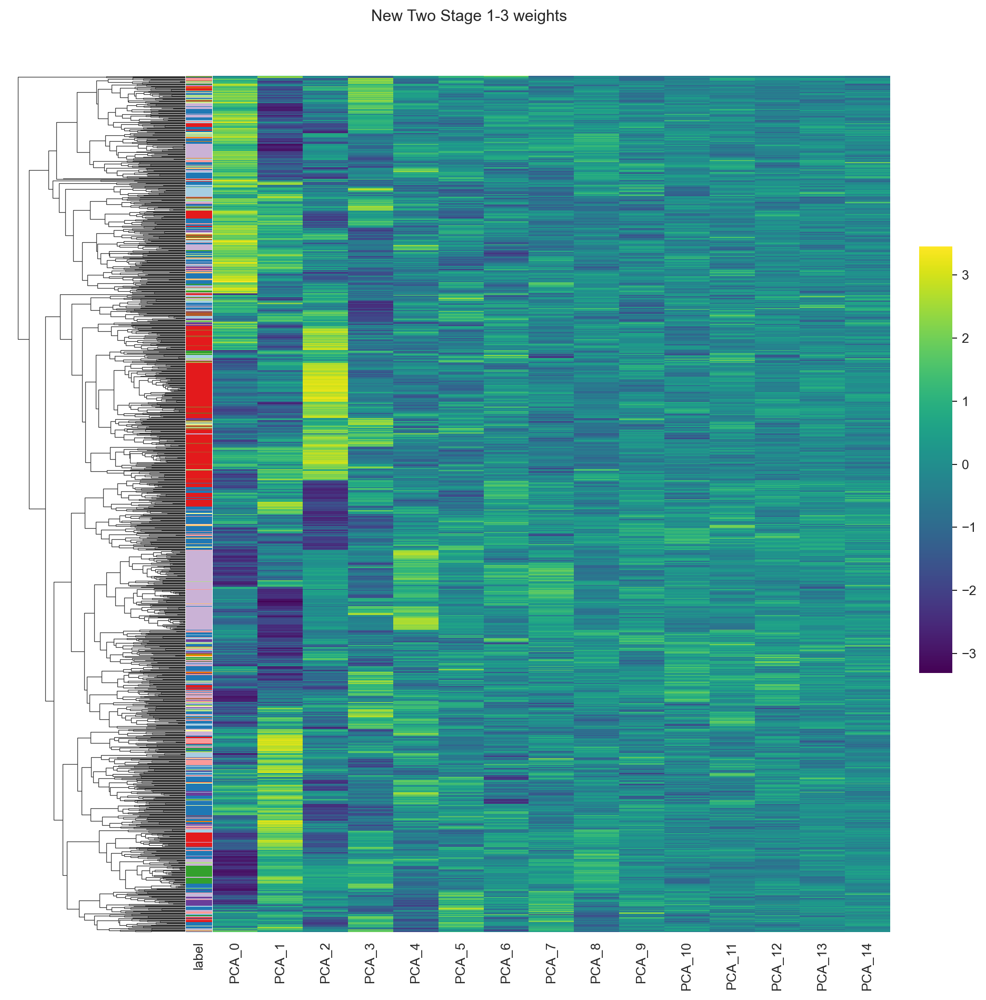

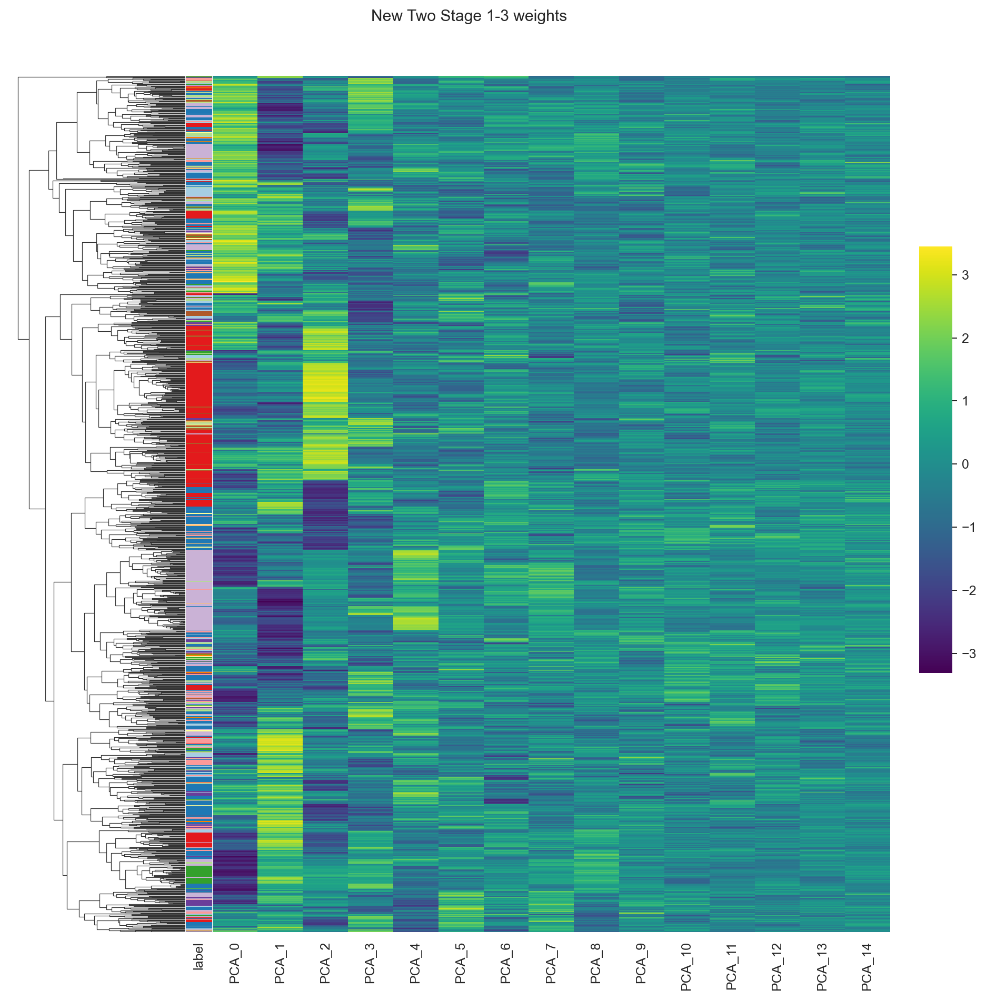

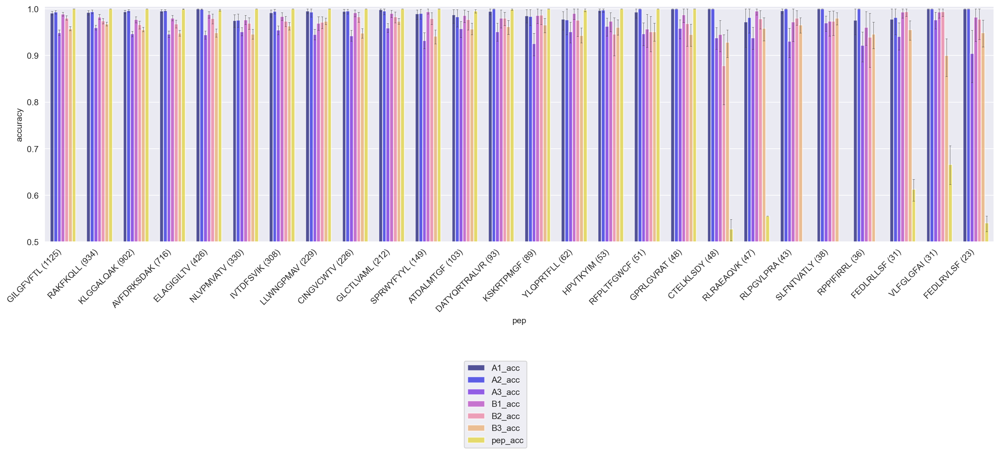

In [24]:
model_2st_low_WD = get_model('../output/240227_TWOSTAGE_CosTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240228_1520_LMOR2/').vae
preds_2st_low_WD = predict_model(model_2st_low_WD, dataset_pep, loader_pep)
results_2st_low_WD = clustering_tune_plot_pipeline(preds_2st_low_WD, title='New Two Stage 1-3 weights', fn = 'new2st_diffweights_LMOR2')
accs_2st_low_WD, gb_2st_low_WD, melted_2st_low_WD = get_accs_make_plot(preds_2st_low_WD, mldict);


making distmatrix
tuning hp


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [06:18<00:00,  1.32it/s]


NameError: name 'accs_ct' is not defined

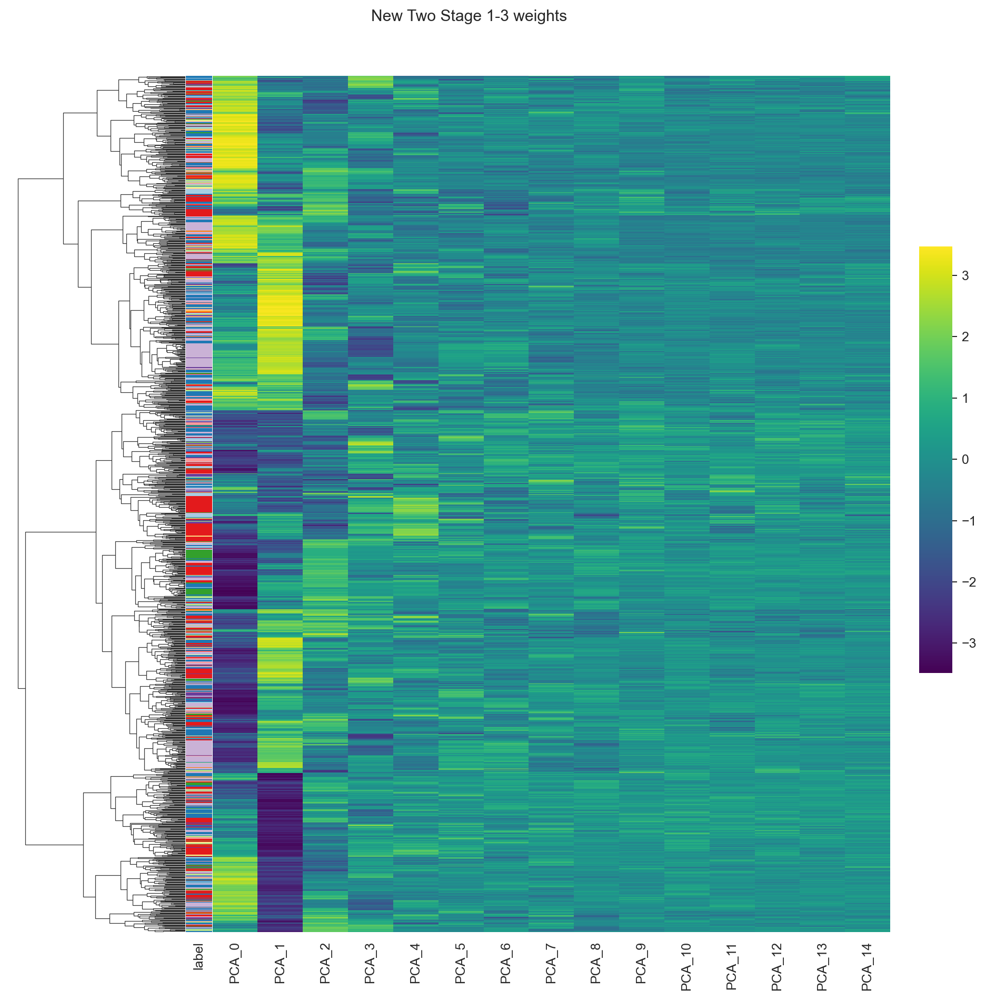

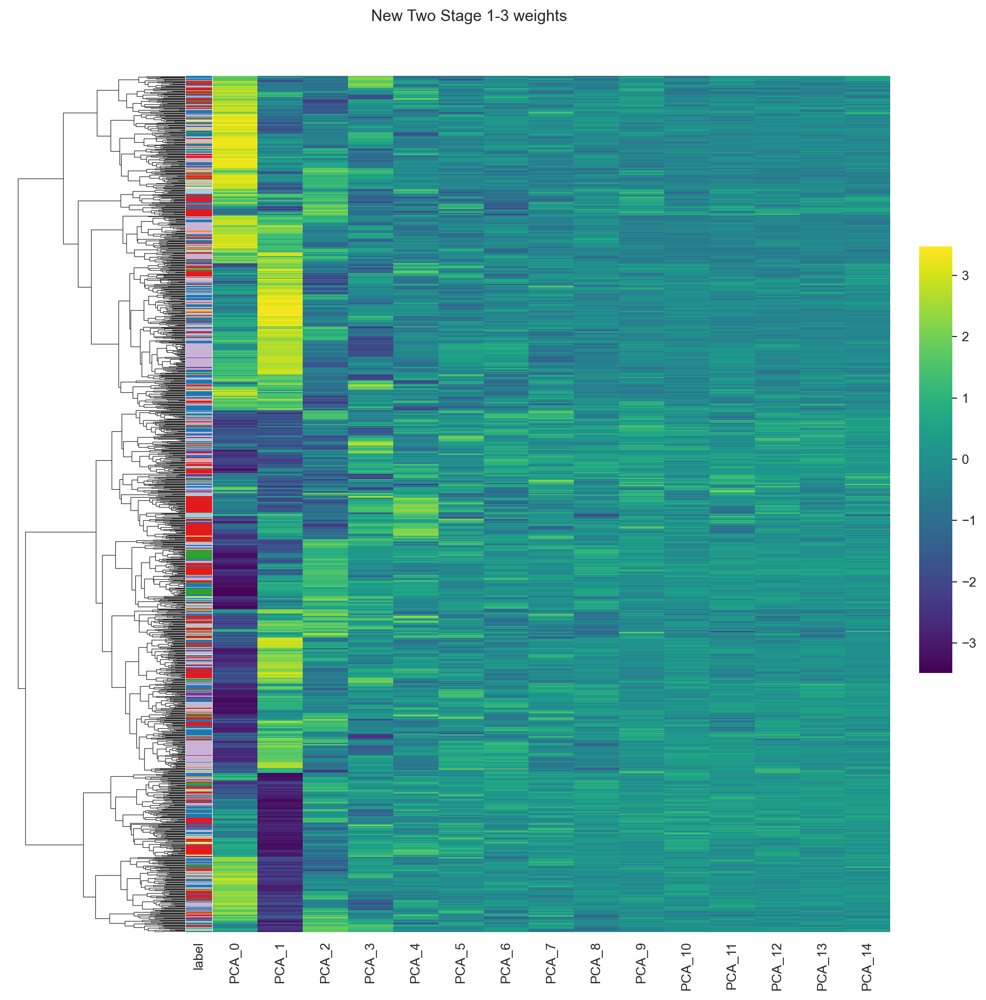

In [14]:
model_notrp_2st_low_WD = get_model('../output/240227_TWOSTAGE_NoTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240229_1711_LMOR2/').vae
preds_notrp_2st_low_WD = predict_model(model_notrp_2st_low_WD, dataset_pep, loader_pep)
results_notrp_2st_low_WD = clustering_tune_plot_pipeline(preds_notrp_2st_low_WD, title='New Two Stage 1-3 weights', fn = 'new2st_diffweights_LMOR2')


In [21]:
results_notrp_2st_low_WD.sort_values('hmean',ascending=False)

,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
248,average,0.278677,1901.73301,1.51582,hierarchical,0.870554,6.997654e-01,7.758724e-01,0.785160
288,average,0.313948,1901.73301,1.51582,hierarchical,0.870554,6.997654e-01,7.758724e-01,0.785160
307,average,0.330701,1901.73301,1.51582,hierarchical,0.870554,6.997654e-01,7.758724e-01,0.785160
306,average,0.329820,1901.73301,1.51582,hierarchical,0.870554,6.997654e-01,7.758724e-01,0.785160
305,average,0.328938,1901.73301,1.51582,hierarchical,0.870554,6.997654e-01,7.758724e-01,0.785160
...,...,...,...,...,...,...,...,...,...
809,complete,0.352745,296.14892,2.66734,hierarchical,0.125391,2.220446e-16,4.440892e-16,0.062696
810,complete,0.353627,296.14892,2.66734,hierarchical,0.125391,2.220446e-16,4.440892e-16,0.062696
811,complete,0.354509,296.14892,2.66734,hierarchical,0.125391,2.220446e-16,4.440892e-16,0.062696
813,complete,0.356273,296.14892,2.66734,hierarchical,0.125391,2.220446e-16,4.440892e-16,0.062696


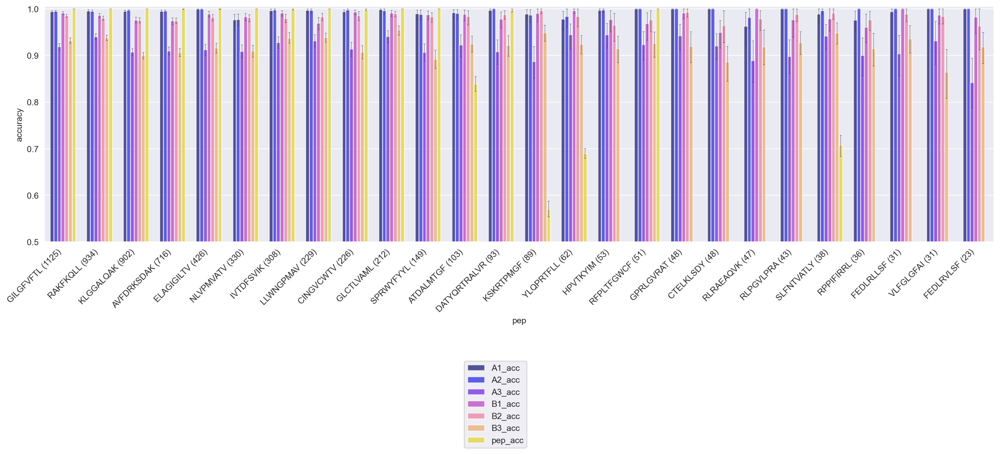

In [16]:
accs_notrp_2st_low_WD, gb_notrp_2st_low_WD, melted_notrp_2st_low_WD = get_accs_make_plot(preds_notrp_2st_low_WD, mldict);


making distmatrix
tuning hp


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [10:22<00:00,  1.25s/it]


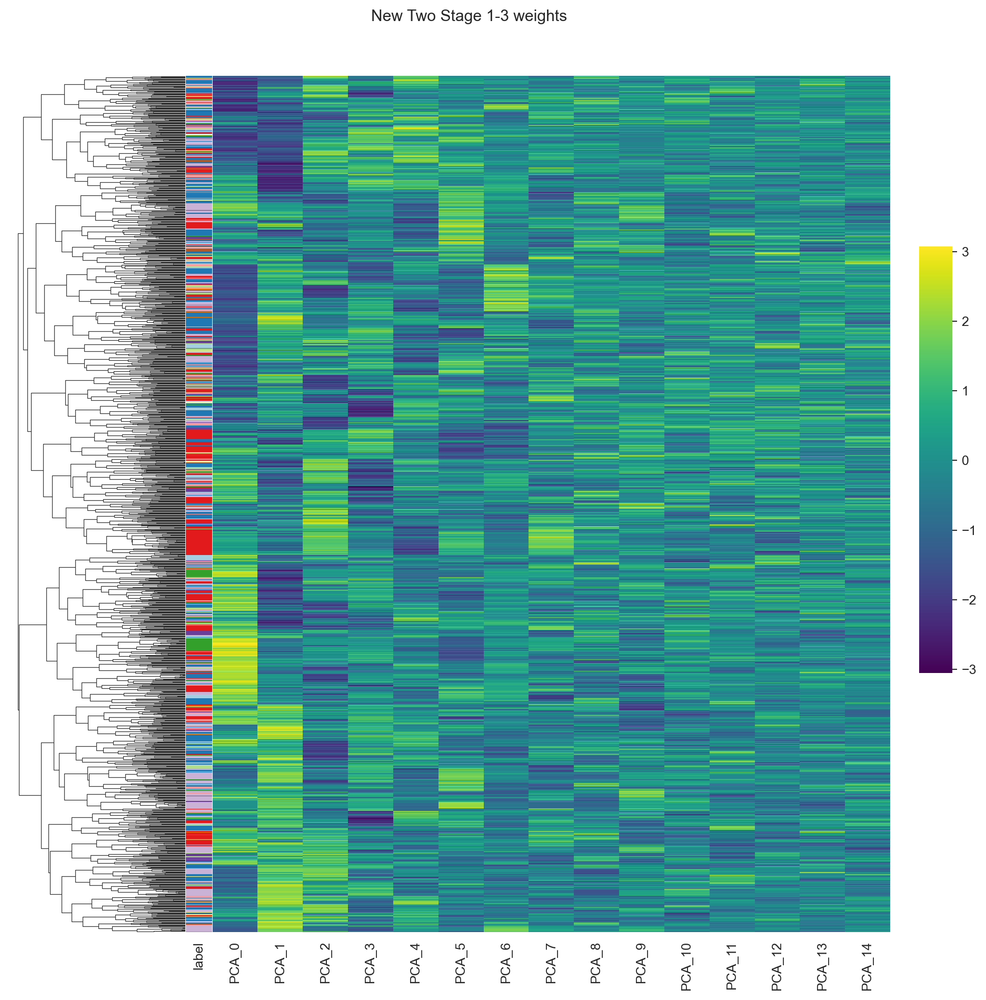

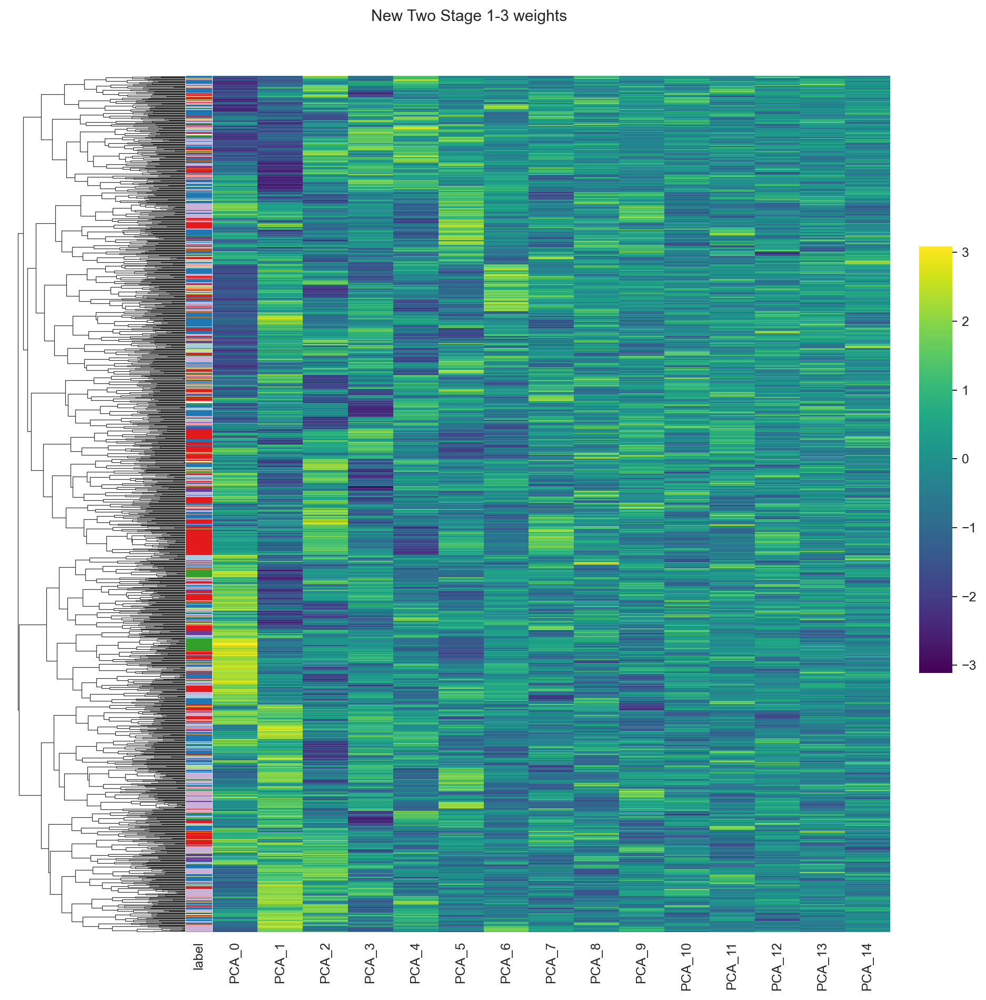

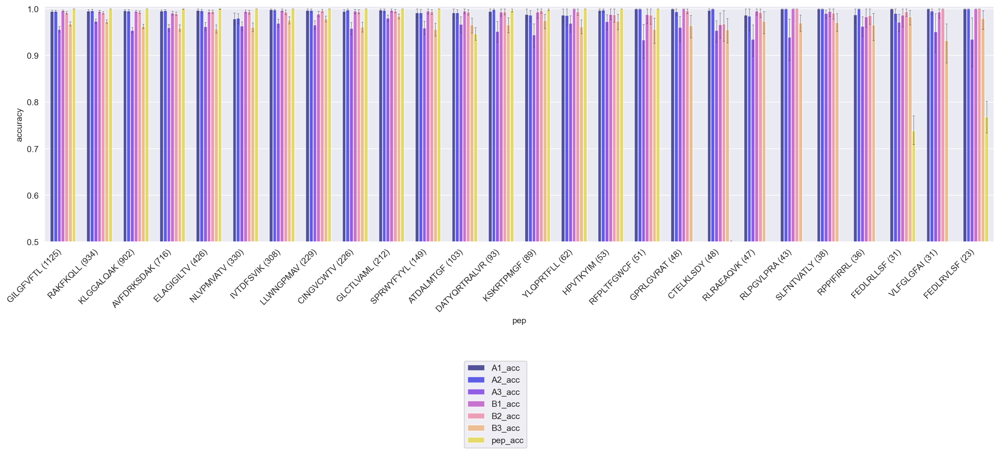

In [17]:
model_notrp_low_WD = get_model('../output/240227_ONESTAGE_NoTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240229_1710_LVTP1/')
preds_notrp_low_WD = predict_model(model_notrp_low_WD, dataset_pep, loader_pep)
results_notrp_low_WD = clustering_tune_plot_pipeline(preds_notrp_low_WD, title='New Two Stage 1-3 weights', fn = 'new2st_diffweights_LMOR2')
accs_notrp_low_WD, gb_notrp_low_WD, melted_notrp_low_WD = get_accs_make_plot(preds_notrp_low_WD, mldict);


In [19]:
results_notrp_low_WD.sort_values('hmean',ascending=False)

,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
500,complete,0.060000,20.36500,0.21255,hierarchical,0.898456,1.000000e+00,9.465122e-01,0.949228
501,complete,0.060882,20.12237,0.21520,hierarchical,0.882389,9.986958e-01,9.369468e-01,0.940542
502,complete,0.061764,20.05431,0.21584,hierarchical,0.877882,9.983809e-01,9.342621e-01,0.938131
503,complete,0.062645,19.79224,0.21770,hierarchical,0.860528,9.974655e-01,9.239505e-01,0.928997
504,complete,0.063527,19.68016,0.21819,hierarchical,0.853106,9.972243e-01,9.195527e-01,0.925165
...,...,...,...,...,...,...,...,...,...
207,average,0.242525,6.79884,0.75751,hierarchical,0.000113,7.318044e-01,2.251114e-04,0.365958
209,average,0.244289,6.79883,0.76576,hierarchical,0.000112,7.277443e-01,2.237872e-04,0.363928
202,average,0.238116,6.79829,0.73877,hierarchical,0.000076,7.410271e-01,1.522890e-04,0.370552
499,average,0.500000,21.89845,2.24450,hierarchical,1.000000,4.440892e-16,8.881784e-16,0.500000


In [416]:
accs_ct.merge(preds_ct['origin'], left_index=True, right_index=True).groupby('origin').agg(mean_A3_acc=('A3_acc', 'mean'),
 mean_B3_acc=('B3_acc', 'mean'),
 std_A3_acc=('A3_acc', 'std'),
 std_B3_acc=('B3_acc', 'std'),
 mean_B3_blsm=('B3_blsm','mean'),
 mean_A3_blsm=('A3_blsm','mean'),
 count=('B3', 'count'),
 )

,mean_A3_acc,mean_B3_acc,std_A3_acc,std_B3_acc,mean_B3_blsm,mean_A3_blsm,count
origin,,,,,,,
10x,0.841457,0.846085,0.148521,0.129211,3.731307,4.667390,4146
IEDB,0.788271,0.778896,0.184116,0.168556,2.561856,3.989664,388
VDJdb,0.827756,0.827846,0.147502,0.126366,3.063771,4.206271,1819


In [450]:
accs_new.merge(preds_ct['origin'], left_index=True, right_index=True).groupby('origin').agg(mean_A3_acc=('A3_acc', 'mean'),
 mean_B3_acc=('B3_acc', 'mean'),
 std_A3_acc=('A3_acc', 'std'),
 std_B3_acc=('B3_acc', 'std'),
 mean_B3_blsm=('B3_blsm','mean'),
 mean_A3_blsm=('A3_blsm','mean'),
 count=('B3', 'count'),
 )

,mean_A3_acc,mean_B3_acc,std_A3_acc,std_B3_acc,mean_B3_blsm,mean_A3_blsm,count
origin,,,,,,,
10x,0.748008,0.767475,0.174353,0.154177,2.987458,3.470574,4146
IEDB,0.684982,0.705844,0.213029,0.175653,1.832474,2.755155,388
VDJdb,0.731019,0.748120,0.167204,0.143421,2.622870,3.111050,1819


In [449]:
accs_2st_ct.merge(preds_ct['origin'], left_index=True, right_index=True).groupby('origin').agg(mean_A3_acc=('A3_acc', 'mean'),
 mean_B3_acc=('B3_acc', 'mean'),
 std_A3_acc=('A3_acc', 'std'),
 std_B3_acc=('B3_acc', 'std'),
 mean_B3_blsm=('B3_blsm','mean'),
 mean_A3_blsm=('A3_blsm','mean'),
 count=('B3', 'count'),
 )

,mean_A3_acc,mean_B3_acc,std_A3_acc,std_B3_acc,mean_B3_blsm,mean_A3_blsm,count
origin,,,,,,,
10x,0.730627,0.770293,0.188517,0.159944,4.990594,4.726403,4146
IEDB,0.684991,0.721714,0.222053,0.189057,4.637454,4.500184,388
VDJdb,0.717279,0.761954,0.180063,0.147862,4.933362,4.648522,1819


In [417]:
accs_low_WD.merge(preds_ct['origin'], left_index=True, right_index=True).groupby('origin').agg(mean_A3_acc=('A3_acc', 'mean'),
                                                                                           mean_B3_acc=('B3_acc', 'mean'),
                                                                                           std_A3_acc=('A3_acc', 'std'),
                                                                                           std_B3_acc=('B3_acc', 'std'),
                                                                                           mean_B3_blsm=('B3_blsm','mean'),
                                                                                           mean_A3_blsm=('A3_blsm','mean'),
                                                                                           count=('B3', 'count'),
                                                                                           )

,mean_A3_acc,mean_B3_acc,std_A3_acc,std_B3_acc,mean_B3_blsm,mean_A3_blsm,count
origin,,,,,,,
10x,0.930307,0.939714,0.108469,0.083960,6.232867,6.762663,4146
IEDB,0.897831,0.907237,0.143990,0.132493,5.465116,6.111111,388
VDJdb,0.928342,0.937715,0.109149,0.083060,6.068757,6.725523,1819


In [418]:
accs_2st_low_WD.merge(preds_ct['origin'], left_index=True, right_index=True).groupby('origin').agg(mean_A3_acc=('A3_acc', 'mean'),
                                                                                           mean_B3_acc=('B3_acc', 'mean'),
                                                                                           std_A3_acc=('A3_acc', 'std'),
                                                                                           std_B3_acc=('B3_acc', 'std'),
                                                                                           mean_B3_blsm=('B3_blsm','mean'),
                                                                                           mean_A3_blsm=('A3_blsm','mean'),
                                                                                           count=('B3', 'count'),
                                                                                           )

,mean_A3_acc,mean_B3_acc,std_A3_acc,std_B3_acc,mean_B3_blsm,mean_A3_blsm,count
origin,,,,,,,
10x,0.952070,0.959862,0.085560,0.071392,7.298601,7.389291,4146
IEDB,0.920813,0.928968,0.133142,0.105934,6.018088,6.878866,388
VDJdb,0.949225,0.956347,0.087249,0.075291,7.074766,7.212321,1819


In [429]:
accs_tight.merge(preds_ct['origin'], left_index=True, right_index=True).groupby('origin').agg(mean_A3_acc=('A3_acc', 'mean'),
                                                                                           mean_B3_acc=('B3_acc', 'mean'),
                                                                                           std_A3_acc=('A3_acc', 'std'),
                                                                                           std_B3_acc=('B3_acc', 'std'),
                                                                                           mean_B3_blsm=('B3_blsm','mean'),
                                                                                           mean_A3_blsm=('A3_blsm','mean'),
                                                                                           count=('B3', 'count'),
                                                                                           )

,mean_A3_acc,mean_B3_acc,std_A3_acc,std_B3_acc,mean_B3_blsm,mean_A3_blsm,count
origin,,,,,,,
10x,0.880864,0.893059,0.132583,0.113633,5.825258,5.684623,4146
IEDB,0.828539,0.837743,0.170806,0.149189,5.478817,5.435231,388
VDJdb,0.867438,0.885749,0.135013,0.108081,5.739967,5.605033,1819


In [428]:
tight_preds = pd.read_csv('../output/240119_PosEnc_AddPep/240115_twostageFullTCR_WarmUpLowerMargin2Kepochs_KFold_1_240115_1401_TIGHT/valid_predictions_kcv_231205_nettcr_old_26pep_with_swaps_f01_240115_twostageFullTCR_WarmUpLowerMargin2Kepochs_KFold_1_240115_1401_TIGHT.csv')
roc_auc_score(tight_preds['binder'], tight_preds['pred_prob']), roc_auc_score(tight_preds['binder'], tight_preds['pred_prob'], max_fpr=0.1)

(0.8216675816947894, 0.6868205312272537)

In [425]:
old_2st = pd.read_csv('../output/240129_pepswapped/240126_PepSwapped_2stageFull_CosTrp_PosEncode_AddPep_1k25WU_3kEp_LowMarg_fold_1_KFold_1_240126_1430_PEPEP/valid_predictions_kcv_231205_nettcr_old_26pep_with_swaps_f01_240126_PepSwapped_2stageFull_CosTrp_PosEncode_AddPep_1k25WU_3kEp_LowMarg_fold_1_KFold_1_240126_1430_PEPEP.csv')
roc_auc_score(old_2st['binder'], old_2st['pred_prob']), roc_auc_score(old_2st['binder'], old_2st['pred_prob'], max_fpr=0.1)

(0.8215293869495504, 0.6898880347995727)

In [426]:
old_2st = pd.read_csv('../output/240129_pepswapped/240126_PepSwapped_2stageFull_NoTrp_PosEncode_AddPep_1k25WU_3kEp_LowMarg_fold_1_KFold_1_240126_1430_PEPEP/valid_predictions_kcv_231205_nettcr_old_26pep_with_swaps_f01_240126_PepSwapped_2stageFull_NoTrp_PosEncode_AddPep_1k25WU_3kEp_LowMarg_fold_1_KFold_1_240126_1430_PEPEP.csv')
roc_auc_score(old_2st['binder'], old_2st['pred_prob']), roc_auc_score(old_2st['binder'], old_2st['pred_prob'], max_fpr=0.1)

(0.8082488970128114, 0.6835876269330088)

In [423]:
x = pd.read_csv('../output/240227_TWOSTAGE_CosTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240228_1520_LMOR2/valid_predictions_kcv_231205_nettcr_old_26pep_with_swaps_f01_240227_TWOSTAGE_CosTrp_AddPepswap_PosEnc_PosWeight_f1_KFold_1_240228_1520_LMOR2.csv')
roc_auc_score(x['binder'], x['pred_prob']), roc_auc_score(x['binder'], x['pred_prob'], max_fpr=0.1)

(0.8189137190764177, 0.6878161696511377)

In [424]:
roc_auc_score(nettcr['binder'], nettcr['prediction']), roc_auc_score(nettcr['binder'], nettcr['prediction'], max_fpr=0.1)

(0.8657360842762937, 0.7323686948898394)